#### Importing Libraries

In [61]:
import warnings
warnings.filterwarnings("ignore")
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.metrics import confusion_matrix
import math
import joblib
from sklearn.metrics import mean_squared_error, mean_pinball_loss, r2_score, classification_report, confusion_matrix, mean_absolute_percentage_error
from imblearn.over_sampling import SMOTENC
import lightgbm as lgb


#### Constants

In [62]:
PATH_TO_CVS = 'output/output-energy/'
# This constant contains the unique quantile to represent in the scatter plot of residuals 
ONLY_QUANTILE = 0.95
# A selection of node metrics to represent in the boxplot and in the scatter plot 
COL_TO_PLOT = ['cpu_usage_idle_node', 'cpu_usage_node', 'ram_usage_idle_node', 'ram_usage_node', 'power_usage_idle_node', 'power_usage_node']
# List containing the values whose quantile regression is to be calculated
QUANTILES = [0.05, 0.95]
NODE_TYPES = ["LIGHT", "MID", "HEAVY"]

#### Utilities functions

In [63]:
# Function used to fill NaN values within the dataframe X
def fill_NaN(X):
  for col in X:
    if(col.startswith('success_rate_')):
      X.loc[:, col] = X.loc[:, col].fillna(1)
    else:
      X.loc[:, col] = X.loc[:, col].fillna(0)
  return X

In [64]:
# Function to reweight of dataframe
def resample_dataset(X, y):
  X_resampled, y_resampled = resample(X, y, replace=True, random_state=42)
  return X_resampled, y_resampled

In [65]:
# Function used to split the dataset into training and test set
def split_dataset(X, y):
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
  return X_train, X_test, y_train, y_test

In [66]:
def convert_dataset(X_train, X_test, y_train, y_test):
  X_train_nn = X_train.astype(np.float32)
  X_test_nn = X_test.astype(np.float32)
  y_train_nn = y_train.astype(np.float32)
  y_test_nn = y_test.astype(np.float32)
  
  return X_train_nn, X_test_nn, y_train_nn, y_test_nn

In [67]:
# Function used to calculate the weighted mean squared error
def wmse_score(y_true, y_pred):
  # Calculates the weight of classes for the first target  
  median_cpu = y_true['cpu_usage_node'].median()
  w_majority_cpu = y_true[y_true['cpu_usage_node'] <= median_cpu].shape[0] / y_true.shape[0]
  w_minority_cpu = y_true[y_true['cpu_usage_node'] > median_cpu].shape[0] / y_true.shape[0]

  # Calculate the weight of classes for the second target
  median_ram = y_true['ram_usage_node'].median()
  w_majority_ram = y_true[y_true['ram_usage_node'] <= median_ram].shape[0] / y_true.shape[0]
  w_minority_ram = y_true[y_true['ram_usage_node'] > median_ram].shape[0] / y_true.shape[0]

  # Calculates the MSE for both targets
  mse_cpu = mean_squared_error(y_true['cpu_usage_node'], y_pred['cpu_usage_node'])
  mse_ram = mean_squared_error(y_true['ram_usage_node'], y_pred['ram_usage_node'])

  # Calculates WMSE as a weighted average of the MSEs for the two targets
  wmse = (w_majority_cpu * mse_cpu * y_true.shape[0] / (w_majority_cpu * y_true[y_true['cpu_usage_node'] <= median_cpu].shape[0] + w_minority_cpu * y_true[y_true['cpu_usage_node'] > median_cpu].shape[0]) +
          w_majority_ram * mse_ram * y_true.shape[0] / (w_majority_ram * y_true[y_true['ram_usage_node'] <= median_ram].shape[0] + w_minority_ram * y_true[y_true['ram_usage_node'] > median_ram].shape[0])) / 2

  return wmse

In [68]:
# Function used to calculate metrics based on the task
def metrics(task_type, y_test, y_pred, quantile):
  if(task_type == 'regression'):
    mape = mean_absolute_percentage_error(y_test, y_pred)
    print("mape:", mape)
    mse = mean_squared_error(y_test, y_pred)
    print("mse:", mse)
    rmse = math.sqrt(mse)
    print("rmse:", rmse)
    r2 = r2_score(y_test, y_pred)
    print("R-squared score:", r2)
    std_dev = float(np.std(y_pred))
    print("Standard deviation:", std_dev)
    if quantile != 0:
      quantile_loss = mean_pinball_loss(y_test, y_pred, alpha=quantile)
      print("Quantile loss with library: ", quantile_loss)
    else:
      quantile_loss = "Not calculated for this target"
    return {"mape": mape, "mse": mse, "rmse": rmse, "r2": r2, "quantile_loss": quantile_loss, "std_dev": std_dev}    
  elif(task_type.endswith('classification')):
    report = classification_report(y_test, y_pred)
    print("Classification Report:\n", report)
    return {}

In [69]:
# Function used to plot the regression lines for the 2 targets
def plot_regression(y_test, y_pred, target_name):
  # Calculate the regression lines
  m, q = np.polyfit(y_test.ravel(), y_pred.ravel(), 1)

  # Plot the regression lines
  plt.plot(y_test, y_pred, 'o', color='red', fillstyle='none')
  plt.plot(y_test, m*y_test + q, linestyle='--')
  plt.xlabel('Valori osservati')
  plt.ylabel('Valori predetti')
  plt.title('Regressione di ' + target_name)
  plt.xlim(0, 1) 
  plt.ylim(0, 1)  
  plt.show()

  # Calculate residuals 
  residuals = y_test.flatten() - y_pred.flatten()

  # Scatter plot with regression line
  sns.scatterplot(x=y_test.flatten(), y=residuals, label=f'Osservazioni')

  # Add the horizontal line near the value 0.0 of the y-axis
  plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
  plt.xlabel('Valori osservati')
  plt.ylabel('Residui (Valori osservati - Valori predetti)')
  plt.title(f'Regressione Standard - {target_name}')
  plt.legend()
  plt.show()

In [70]:
# Function used to plots quantile regression results.
def plot_quantile_regression(y_test, y_pred, target_name):    
    point = 1
    line = 3
    for col in y_pred:
        m, q = np.polyfit(y_test.ravel(), y_pred[col], 1)
        plt.plot(y_test, y_pred[col], 'o', fillstyle='none', label=f'Osservazioni - {col}')
        plt.plot(y_test, m*y_test + q, linestyle='--', zorder = line)
        point = point + 1
        line = line + 1
    plt.xlabel('Valori osservati')
    plt.ylabel('Valori predetti')
    plt.title('Regressione Quantile di ' + target_name)
    plt.xlim(0, 1)  
    plt.ylim(0, 1)  
    plt.legend()
    plt.show()

    # Calculate quantile residuals
    residuals = y_test.flatten() - y_pred[str(ONLY_QUANTILE)]

    # Scatter plot with regression line
    sns.scatterplot(x=y_test.flatten(), y=residuals, label=f'Osservazioni')

    # Add the horizontal line near the value 0.0 of the y-axis
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
    plt.xlabel('Valori osservati')
    plt.ylabel('Residui quantili (Valori osservati - Valori predetti)')
    plt.title(f'Regressione Quantile {ONLY_QUANTILE} - {target_name}')
    plt.legend()
    plt.show()

In [71]:
# Function used to plot the confusion matrix
def plot_confusion_matrix(y_test, y_pred, target):
  # Calculate the confusion matrix
  cm = confusion_matrix(y_test[target], y_pred[target])

  # Plot the confusion matrix as heatmap
  sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
  plt.xlabel('Valori osservati')
  plt.ylabel('Valori predetti')
  plt.title('Confusion matrix')
  plt.show()

In [72]:
# Function used to train the desired model for a target variable
def train_model(target_name, X_train, y_train, quantile):
    # Classification task. Create model with autogluon
    if target_name.startswith('overloaded') or target_name.startswith('replica'):
        model_type = ""
        model = lgb.LGBMClassifier()
    # Quantile regression with LGBM
    elif quantile != 0:
        model = lgb.LGBMRegressor(objective='quantile', alpha=quantile)
        model_type = "quantile" + str(quantile).replace('.', '')
    # Regression with LGBM
    else:
        model = lgb.LGBMRegressor(objective='regression')
        model_type = "regression"
    
    model.fit(X_train, y_train)
    path = './system-forecaster-models/functions/' + target_name + "/" + model_type
    if not os.path.exists(path):
        os.makedirs(path)
    joblib.dump(model, path + "/model.joblib")
    return model



In [73]:
# Function to obtain a barchart of the type of nodes
def plot_node_type_distribution(df):
    """
    Visualizza il numero di dati per ogni tipologia di nodo in un DataFrame tramite un bar chart.

    :param df: DataFrame contenente la colonna 'node_type' con le tipologie di nodo.
    """
    # Count of occurrences for each node type
    node_counts = df['node_type'].value_counts()

    # Bar chart
    plt.figure(figsize=(10, 6))
    node_counts.plot(kind='bar')
    plt.title('Distribuzione del Numero di Dati per Tipologia di Nodo')
    plt.xlabel('Tipologia di Nodo (0 = Heavy, 1 = Mid, 2 = Light)')
    plt.ylabel('Numero di Righe')
    plt.xticks(rotation=0)  # Maintains names of horizontal node types
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

In [74]:
# Function to obtain a barchart of overloaded node distribution
def plot_overloaded_node_distribution(df):
    """
    Visualizza il numero di righe in cui 'overloaded_node' è 1 e quelle in cui è 0.

    :param df: DataFrame contenente la colonna 'overloaded_node'.
    """
    # Count of occurrences of 0 and 1 in the 'overloaded_node' column
    overloaded_counts = df['overloaded_node'].value_counts()

    # Bar chart
    plt.figure(figsize=(8, 5))
    overloaded_counts.plot(kind='bar')
    plt.title('Distribuzione di Nodi Sovraccaricati')
    plt.xlabel('Stato Sovraccarico (0 = No, 1 = Sì)')
    plt.ylabel('Numero di Righe')
    plt.xticks(rotation=0)  
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

#### Retrieving dataset

In [75]:
df = pd.DataFrame()
for node_type in NODE_TYPES:
    # Retrieve all files in the output folder
    file_csv = [file for file in os.listdir(PATH_TO_CVS + node_type) if file.endswith('.csv')]
    # Create the dataframe by concatenating all read files
    dataframes = []
    for file in file_csv:
        file_path = os.path.join(PATH_TO_CVS + node_type, file)
        df_temp = pd.read_csv(file_path)    
        # Remove the columns in the dataframe that begin with "function_"
        df_temp.drop(columns=[col for col in df_temp if col.startswith('function_')], inplace=True)        
        # Aggiungi la colonna "node_type" e assegna il valore di 'type' a tutte le righe
        if node_type == "HEAVY":
            df_temp["node_type"] = 0
        elif node_type == "MID":
            df_temp["node_type"] = 1
        else: 
            df_temp["node_type"] = 2
        
        dataframes.append(df_temp)
        
    df = pd.concat([df, *dataframes], axis=0, ignore_index=True)

df = fill_NaN(df)

functions = [col[14:] for col in df if col.startswith('rate')]

for function in functions:
    df.loc[df['rate_function_' + function] == 0, ['cpu_usage_function_' + function, 'ram_usage_function_' + function, 'power_usage_function_' + function, 'replica_' + function]] = 0

In [76]:
df

,rate_function_shasum,success_rate_function_shasum,cpu_usage_function_shasum,ram_usage_function_shasum,power_usage_function_shasum,replica_shasum,overloaded_function_shasum,medium_latency_function_shasum,rate_function_curl,success_rate_function_curl,...,overloaded_function_env,medium_latency_function_env,rate_function_figlet,success_rate_function_figlet,cpu_usage_function_figlet,ram_usage_function_figlet,power_usage_function_figlet,replica_figlet,overloaded_function_figlet,medium_latency_function_figlet
0,100.0,1.0,7.691,4042069.333,11739.653,2.0,0.0,107580927.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
1,100.0,1.0,7.751,9199274.667,16427.020,1.0,0.0,16880204.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
2,100.0,1.0,8.378,9214634.667,14245.149,2.0,0.0,35575151.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
3,100.0,1.0,8.793,1366357.333,24734.177,2.0,0.0,76360433.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
4,100.0,1.0,7.820,1323008.000,17732.391,2.0,0.0,87032021.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98779,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,13967111.0,70.0,1.0,10.414,1.344819e+07,27201.168,1.0,0.0,16680711.0
98780,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,12078762.0,70.0,1.0,10.012,1.713152e+06,27538.105,1.0,0.0,15961359.0
98781,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,12159595.0,70.0,1.0,8.494,1.336299e+07,25525.116,1.0,0.0,15225328.0
98782,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,16766710.0,70.0,1.0,9.619,1.337362e+07,28618.911,1.0,0.0,38791520.0


In [77]:
df.to_csv(os.path.join(PATH_TO_CVS, "all_results.csv"), index = False)

In [78]:
df.columns

Index(['rate_function_shasum', 'success_rate_function_shasum',
       'cpu_usage_function_shasum', 'ram_usage_function_shasum',
       'power_usage_function_shasum', 'replica_shasum',
       'overloaded_function_shasum', 'medium_latency_function_shasum',
       'rate_function_curl', 'success_rate_function_curl',
       'cpu_usage_function_curl', 'ram_usage_function_curl',
       'power_usage_function_curl', 'replica_curl', 'overloaded_function_curl',
       'medium_latency_function_curl', 'rate_function_eat-memory',
       'success_rate_function_eat-memory', 'cpu_usage_function_eat-memory',
       'ram_usage_function_eat-memory', 'power_usage_function_eat-memory',
       'replica_eat-memory', 'overloaded_function_eat-memory',
       'medium_latency_function_eat-memory', 'cpu_usage_idle_node',
       'cpu_usage_node', 'ram_usage_idle_node', 'ram_usage_node',
       'ram_usage_idle_node_percentage', 'ram_usage_node_percentage',
       'power_usage_idle_node', 'power_usage_node', 'rest_se

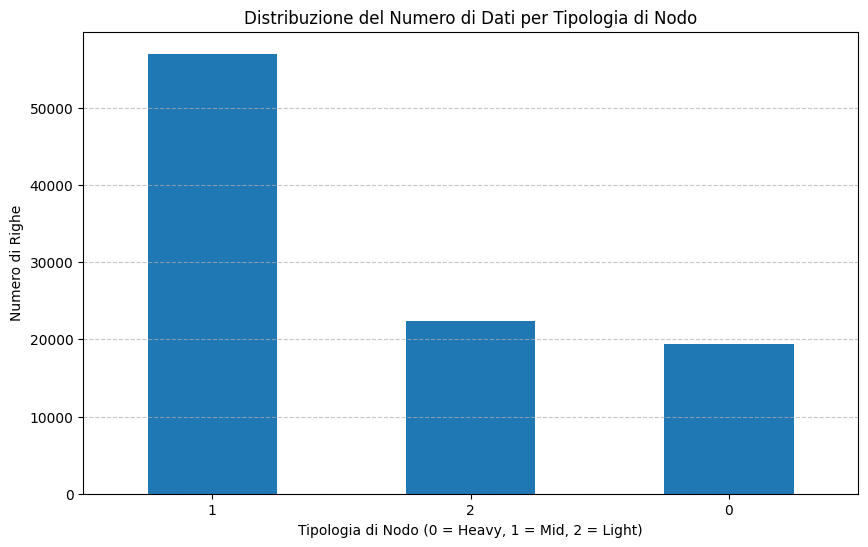

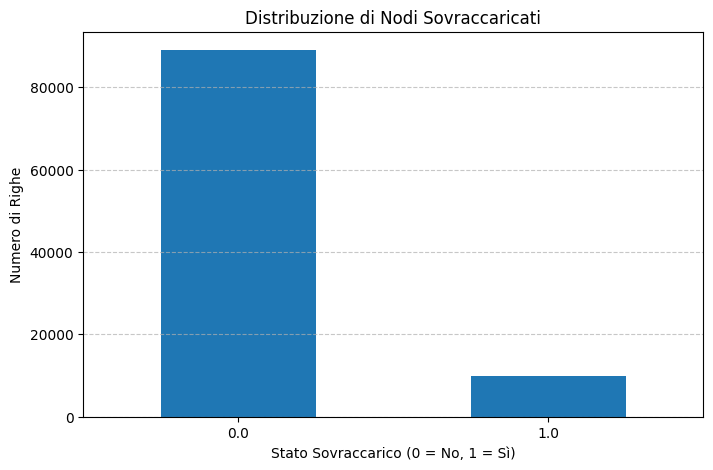

In [79]:
# Plot node type distribution
plot_node_type_distribution(df)
# Plot overloaded node distribution
plot_overloaded_node_distribution(df)

#### Removing outliers

In [80]:
# Iterate over each target column and handle outliers
functions_column = [col for col in df if col.startswith('rate')]
targets = [col for col in df if (col.startswith('power_usage_') or col.startswith('cpu_usage_') or col.startswith('ram_usage_') or col.startswith('overloaded_node') or col.startswith('medium_latency')) and 'idle' not in col]
grouped = df.groupby(functions_column + ['node_type'])
threshold = 1
for target in targets:
    print(target)
    if target != 'overloaded_node':
        mean = grouped[target].transform('mean')
        std = grouped[target].transform('std')
        outliers = (df[target] > mean + threshold * std) | (df[target] < mean - threshold * std)
        print(outliers.sum())
        df[target] = df[target].where(~outliers, mean)
    else:
        new_overloaded = grouped[target].transform('all')
        df['overloaded_node'] = new_overloaded.astype(int)
        print(df["overloaded_node"].value_counts())
df_only_useful = df[functions_column + targets + ["node_type"]]

cpu_usage_function_shasum
23887
ram_usage_function_shasum
23430
power_usage_function_shasum
23895
medium_latency_function_shasum
23610
cpu_usage_function_curl
14017
ram_usage_function_curl
13650
power_usage_function_curl
13997
medium_latency_function_curl
13920
cpu_usage_function_eat-memory
4571
ram_usage_function_eat-memory
4501
power_usage_function_eat-memory
4595
medium_latency_function_eat-memory
4564
cpu_usage_node
32752
ram_usage_node
32400
ram_usage_node_percentage
32140
power_usage_node
32498
overloaded_node
overloaded_node
0    90739
1     8045
Name: count, dtype: int64
cpu_usage_function_nmap
7319
ram_usage_function_nmap
7245
power_usage_function_nmap
7318
medium_latency_function_nmap
7301
cpu_usage_function_env
19397
ram_usage_function_env
18812
power_usage_function_env
19415
medium_latency_function_env
19202
cpu_usage_function_figlet
19900
ram_usage_function_figlet
19762
power_usage_function_figlet
19876
medium_latency_function_figlet
19790


In [81]:
df_only_useful.to_csv(
  os.path.join(PATH_TO_CVS, "all_results_no_outliers.csv"), index = False
)
df_only_useful

,rate_function_shasum,rate_function_curl,rate_function_eat-memory,rate_function_nmap,rate_function_env,rate_function_figlet,cpu_usage_function_shasum,ram_usage_function_shasum,power_usage_function_shasum,medium_latency_function_shasum,...,medium_latency_function_nmap,cpu_usage_function_env,ram_usage_function_env,power_usage_function_env,medium_latency_function_env,cpu_usage_function_figlet,ram_usage_function_figlet,power_usage_function_figlet,medium_latency_function_figlet,node_type
0,100.0,60.0,0.0,0.0,0.0,0.0,7.691,4042069.333,11739.653000,37454241.5,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
1,100.0,60.0,0.0,0.0,0.0,0.0,7.751,9199274.667,13542.554250,16880204.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
2,100.0,60.0,0.0,0.0,0.0,0.0,8.378,9214634.667,14245.149000,35575151.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
3,100.0,60.0,10.0,0.0,0.0,0.0,8.261,1366357.333,20280.961333,76360433.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
4,100.0,60.0,10.0,0.0,0.0,0.0,7.820,1323008.000,17732.391000,87032021.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98779,0.0,0.0,0.0,70.0,20.0,70.0,0.000,0.000,0.000000,0.0,...,1.655140e+10,2.024333,1.616555e+06,8605.155000,1.278133e+07,10.196000,5607879.111,27201.168000,1.611891e+07,0
98780,0.0,0.0,0.0,70.0,20.0,70.0,0.000,0.000,0.000000,0.0,...,1.697898e+10,2.011000,1.553067e+06,8346.938000,1.207876e+07,10.012000,1713152.000,27538.105000,1.596136e+07,0
98781,0.0,0.0,0.0,70.0,30.0,70.0,0.000,0.000,0.000000,0.0,...,1.728170e+10,2.889333,1.520640e+06,12787.386333,1.444850e+07,9.990167,7250379.020,28735.254833,1.522533e+07,0
98782,0.0,0.0,0.0,70.0,30.0,70.0,0.000,0.000,0.000000,0.0,...,1.793603e+10,2.822000,1.727829e+06,13041.002000,1.444850e+07,9.619000,7250379.020,28618.911000,2.362620e+07,0


#### Partitioning into features and targets and oversampling

In [82]:
# Dataframe division by features and output
targets = [col for col in df if (col.startswith('power_usage_') or col.startswith('cpu_usage_') or col.startswith('ram_usage_') or col.startswith('overloaded_node') or col.startswith('medium_latency')) and 'idle' not in col]# or col.startswith('replica')
params = [col for col in df if col.startswith('rate_') or 'node_type' in col]

# Initialize a dictionary to store target datasets
target_datasets = {}
features_datasets = {}
features_datasets['original'] = df[params]
for target_name in targets:
    X = df[params]
    y = df[[target_name]]
    node_type_index = X.columns.get_loc("node_type")

    if "overloaded" in target_name:
        print("Status of target: " + target_name)
        print(y.value_counts())
        # Oversampling
        sm = SMOTENC(random_state=42, categorical_features=[node_type_index])
        try:
            X_res, y_res = sm.fit_resample(X, y)
            print("Status after SMOTE:")
            print(y_res.value_counts())
            print(X_res["node_type"].value_counts())
            features_datasets[target_name] = X_res
            y = y_res
        except:
            print("It was not possible to perform SMOTE for target " + target_name)
    else:
        if "node" not in target_name:
            function_name = target_name.split("_")[-1]
            # Drop rows whose input rate is zero
            X_res = df[df[f"rate_function_{function_name}"] > 0][params]
            y = df[df[f"rate_function_{function_name}"] > 0][[target_name]]
            features_datasets[target_name] = X_res

    target_datasets[target_name] = y

Status of target: overloaded_node
overloaded_node
0                  90739
1                   8045
Name: count, dtype: int64
Status after SMOTE:
overloaded_node
0                  90739
1                  90739
Name: count, dtype: int64
node_type
1    84236
2    65824
0    31418
Name: count, dtype: int64


#### Preprocessing

In [83]:
# Initialize dictionaries to store scaled data and train-test splits
x_train_dict = {}
x_test_dict = {}
y_train_dict = {}
y_test_dict = {}
y_scalers = {}
scaler_exist = False

for target_name in targets:
    # Get the target dataset for the current iteration
    target_dataset = target_datasets[target_name]    

    # Apply scaling for x (features)
    if "overloaded" in target_name or "node" not in target_name:
        X = features_datasets[target_name]
    else:
        X = features_datasets['original']
    scaler_x = MinMaxScaler()
    scaler_x.fit(X)
    X_scaled = scaler_x.transform(X)

    # Apply scaling for y (target)
    scaler_y = MinMaxScaler()
    scaler_y.fit(target_dataset)
    y_scalers[target_name] = scaler_y
    if target_name.startswith('overloaded') or target_name.startswith('replica'):
        y_scaled = target_dataset
    else:
        y_scaled = scaler_y.transform(target_dataset)
    
    # Save the scaler for x
    scaler_x_path = './scalers/functions/scaler_x/' 
    if not os.path.exists(scaler_x_path):
        os.makedirs(scaler_x_path)
    if target_name.startswith('overloaded'):
        joblib.dump(scaler_x, scaler_x_path + "/" + target_name + ".joblib")
    elif not scaler_exist:
        scaler_exist = True
        joblib.dump(scaler_x, scaler_x_path + "/features.joblib")

    # Save the scaler for y
    scaler_y_path = './scalers/functions/scaler_y/'
    if not os.path.exists(scaler_y_path):
        os.makedirs(scaler_y_path)
    if not target_name.startswith("overloaded"):
        joblib.dump(scaler_y, scaler_y_path + "/" + target_name + ".joblib")

    # Split the dataset into training and testing
    x_train, x_test, y_train, y_test = train_test_split(X_scaled, y_scaled)
    x_train_dict[target_name] = x_train
    x_test_dict[target_name] = x_test
    y_train_dict[target_name] = y_train
    y_test_dict[target_name] = y_test

#### Train models

In [84]:
#One Model for each target variable
#Initialize a dictionary to store models
trained_models = {}
for target_name in targets:
    #Get the corresponding x_train for the current target
    x_train = x_train_dict[target_name]

    # Get the corresponding y_train for the current target
    y_train = y_train_dict[target_name]

    #Trains the specific model for the current target
    model = train_model(target_name, x_train, y_train, 0)  # Use the specific target's y_train
    trained_models[target_name] = model
    if not(target_name.startswith('overloaded') or target_name.startswith('replica')):
        for quantile in QUANTILES:
            model = train_model(target_name, x_train, y_train, quantile)
            trained_models[target_name + " " + str(quantile)] = model


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.277961
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.037656
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

#### Predict

In [85]:
# Initialize dictionary to store predictions
all_predictions = {}  
for target_name in targets:

    # Get the corresponding x_train for the current target
    x_test = x_test_dict[target_name]

    # Get the test dataset for the current iteration
    y_test = y_test_dict[target_name]

    # Train model
    test_data = pd.DataFrame(np.column_stack((x_test, y_test)), columns=[*params, target_name])

    model = trained_models[target_name]
    
    y_pred = model.predict(test_data.drop(columns=[target_name]))
    all_predictions[target_name] = y_pred
    if not(target_name.startswith('overloaded') or target_name.startswith('replica')):
        y_pred_quantiles = {}
        for quantile in QUANTILES:
            model = trained_models[target_name + " " + str(quantile)]
            y_pred_quantiles[str(quantile)] = model.predict(test_data.drop(columns=[target_name]))
        all_predictions[target_name + " quantiles"] = y_pred_quantiles

#### Plot results

Target: cpu_usage_function_shasum
mape: 0.0453192270796867
mse: 0.00028223790635414854
rmse: 0.016799937688996007
R-squared score: 0.9892667618441484
Standard deviation: 0.16068924780809654


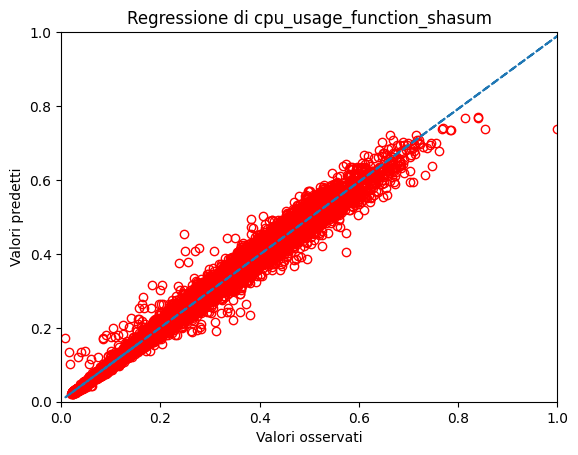

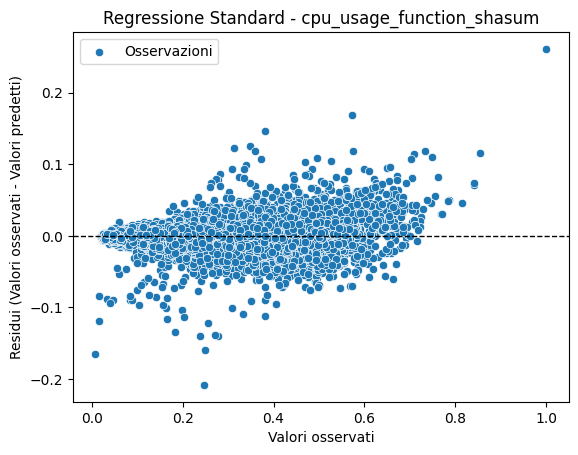

mape: 0.044776293888024996
mse: 0.29334484883369016
rmse: 0.5416131911555424
R-squared score: 0.9892667618441484
Standard deviation: 5.180460660085225
Quantile loss with library:  0.18170689398708412
------------------------------
Target: cpu_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 4.610342720657668 % of cases and less or equal in 95.38965727934233 % of cases.
mape: 0.10215023817145703
mse: 0.0020397563273228656
rmse: 0.045163661580111786
R-squared score: 0.9224300140123975
Standard deviation: 0.1407325912649966
Quantile loss with library:  0.001794489850551516
Prediction for alpha 0.95 are greater than true values in 95.23968227517636 % of cases and less or equal in 4.760317724823641 % of cases.
mape: 0.14209268287297383
mse: 0.0010712115624525492
rmse: 0.03272936850066847
R-squared score: 0.9592628468527606
Standard deviation: 0.1692563212546591
Quantile loss with library:  0.0015743615455118254


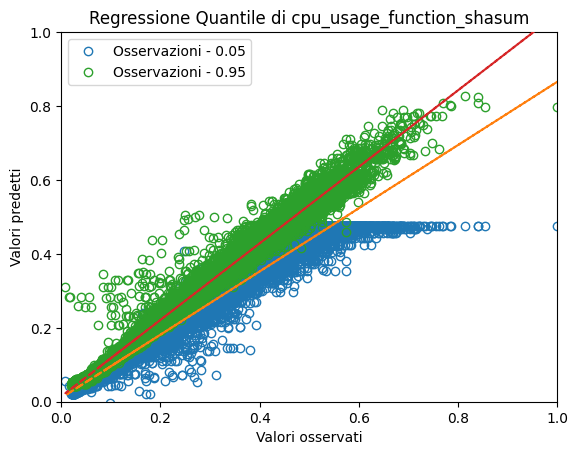

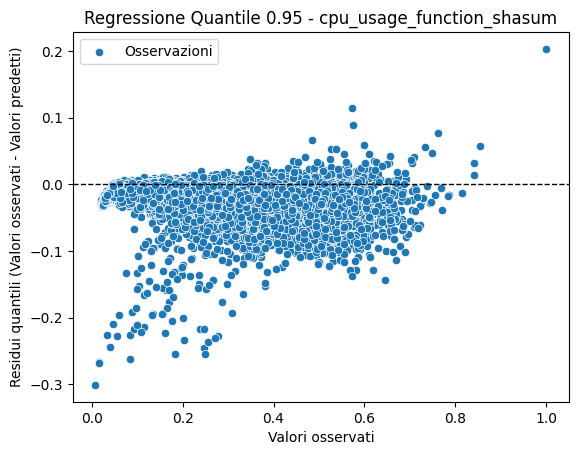

mape: 0.1395517951334509
mse: 1.1133670806863438
rmse: 1.055162111093051
R-squared score: 0.9592628468527606
Standard deviation: 5.456654540928954
Quantile loss with library:  0.05075584186575574
------------------------------
Target: ram_usage_function_shasum
mape: 3.6455150452786507
mse: 0.0028192205880417476
rmse: 0.05309633309412005
R-squared score: 0.8352866859270016
Standard deviation: 0.11807204988880277


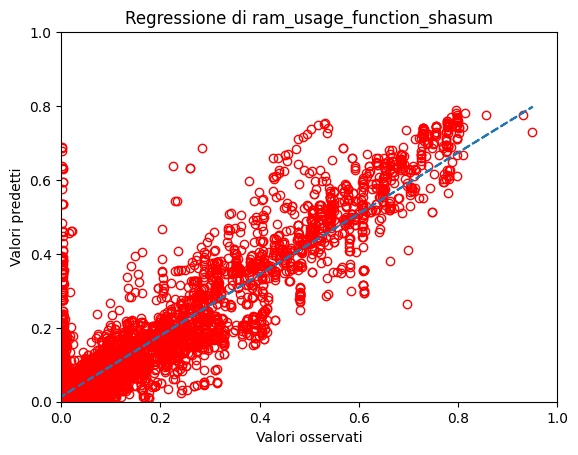

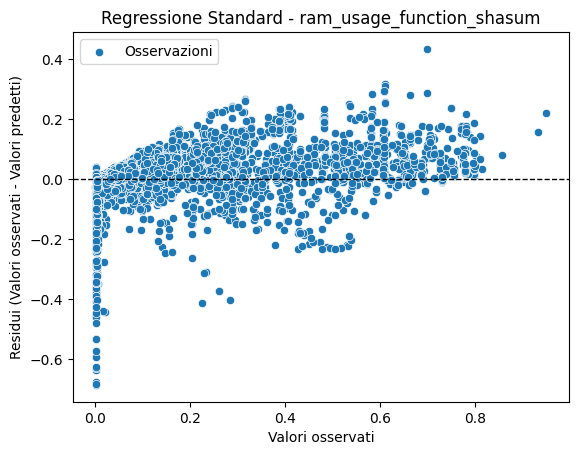

mape: 1.8985900452265645
mse: 168105801414893.3
rmse: 12965562.132622454
R-squared score: 0.8352866859270016
Standard deviation: 28831943.935670782
Quantile loss with library:  3600532.350551408
------------------------------
Target: ram_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.082486252291285 % of cases and less or equal in 94.91751374770871 % of cases.
mape: 0.691527640880293
mse: 0.016705772708234277
rmse: 0.12925081318210063
R-squared score: 0.023963148327160955
Standard deviation: 0.039810602644366165
Quantile loss with library:  0.0034469164986948306
Prediction for alpha 0.95 are greater than true values in 95.5396322835083 % of cases and less or equal in 4.460367716491696 % of cases.
mape: 10.87217329049314
mse: 0.010123731614433468
rmse: 0.10061675613153839
R-squared score: 0.4085197192188531
Standard deviation: 0.14727279590162595
Quantile loss with library:  0.0037667471408953973


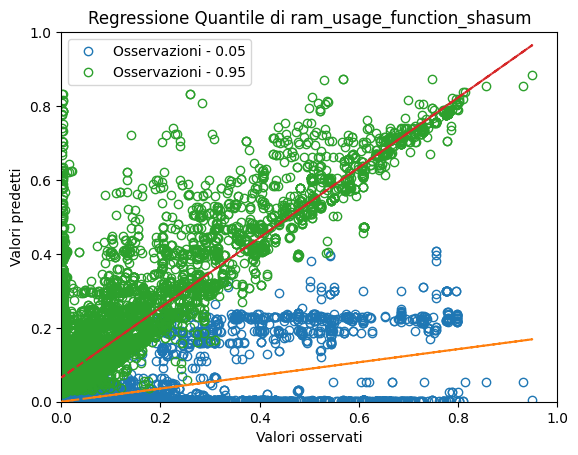

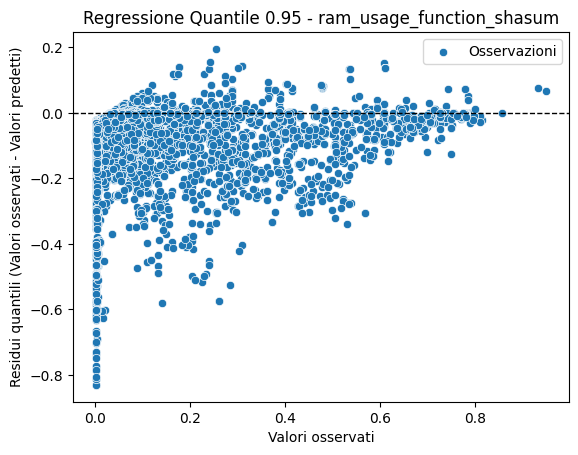

mape: 5.5683219250558045
mse: 603662595106030.2
rmse: 24569546.090761025
R-squared score: 0.4085197192188529
Standard deviation: 35962456.810770124
Quantile loss with library:  919799.7535269652
------------------------------
Target: power_usage_function_shasum
mape: 142366652874.5884
mse: 0.0012027816709211296
rmse: 0.03468114287218819
R-squared score: 0.9486624657141899
Standard deviation: 0.14844895182125661


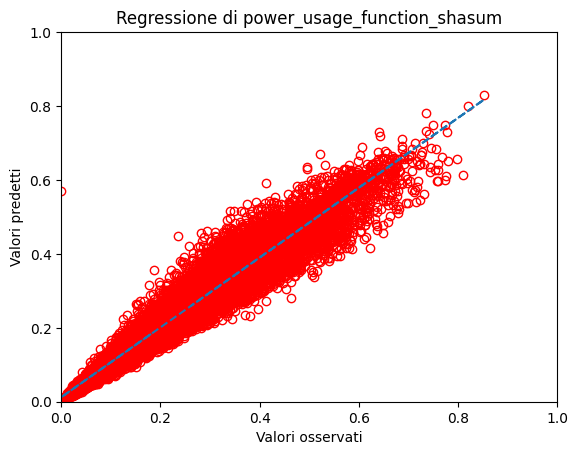

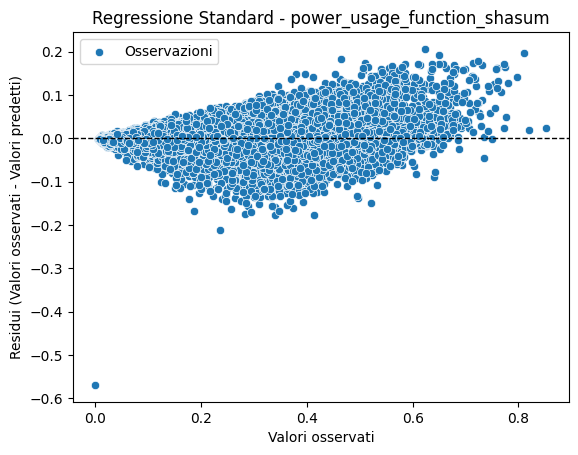

mape: 0.15209206753234344
mse: 8194686.552842529
rmse: 2862.636294195008
R-squared score: 0.9486624657141899
Standard deviation: 12253.210884221446
Quantile loss with library:  941.3580736974968
------------------------------
Target: power_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.05471310337166 % of cases and less or equal in 94.94528689662835 % of cases.
mape: 111467509385.71718
mse: 0.005422509916869555
rmse: 0.07363769358738469
R-squared score: 0.7685545968128654
Standard deviation: 0.11199135616218531
Quantile loss with library:  0.0030323863079090825
Prediction for alpha 0.95 are greater than true values in 94.77864800311059 % of cases and less or equal in 5.221351996889408 % of cases.
mape: 175196007146.19623
mse: 0.005100818108725916
rmse: 0.07142001196251592
R-squared score: 0.7822851554248791
Standard deviation: 0.17785783127536497
Quantile loss with library:  0.0033089581600922314


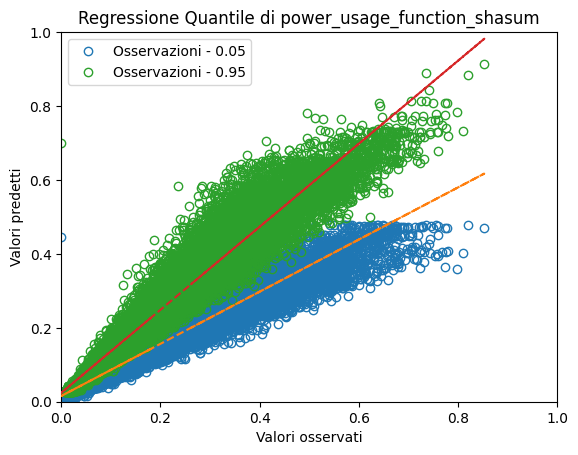

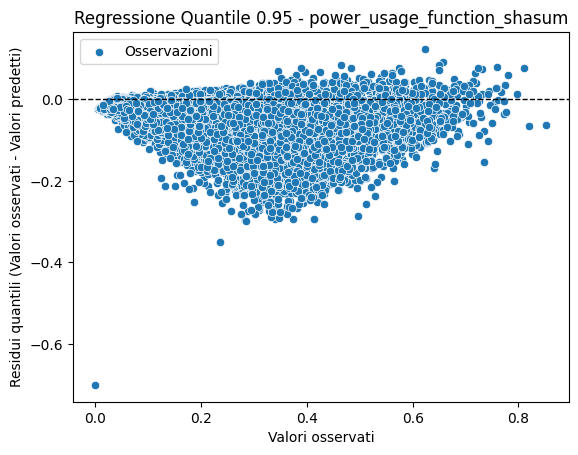

mape: 0.3525463157442221
mse: 34752446.412041195
rmse: 5895.1205595849515
R-squared score: 0.7822851554248791
Standard deviation: 14680.666230984207
Quantile loss with library:  273.1266313789476
------------------------------
Target: medium_latency_function_shasum
mape: 2.2606607556048863
mse: 0.0002394862945463281
rmse: 0.015475344731098177
R-squared score: 0.8504021707143753
Standard deviation: 0.03531632153816186


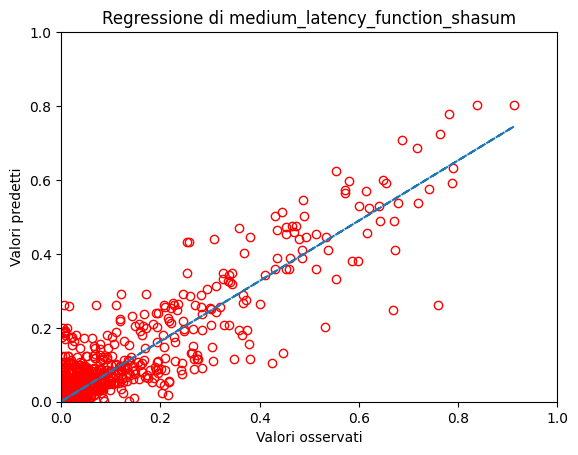

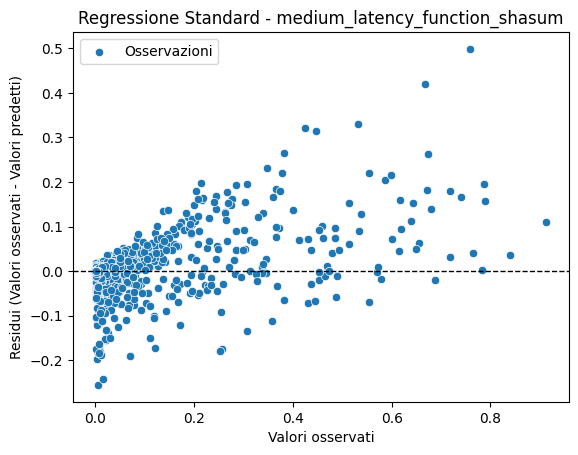

mape: 1.128025733567593
mse: 1.3997989556592154e+17
rmse: 374138872.03272736
R-squared score: 0.8504021707143753
Standard deviation: 853823222.307975
Quantile loss with library:  37185819.38841177
------------------------------
Target: medium_latency_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.432427928678553 % of cases and less or equal in 94.56757207132145 % of cases.
mape: 0.4372211812988744
mse: 0.001614615110954536
rmse: 0.04018227359115629
R-squared score: -0.00858763624922454
Standard deviation: 0.00041155194892993107
Quantile loss with library:  0.00027746135902198044
Prediction for alpha 0.95 are greater than true values in 95.2952285730156 % of cases and less or equal in 4.704771426984392 % of cases.
mape: 3.766124401267202
mse: 0.0008290133033181398
rmse: 0.028792591118517622
R-squared score: 0.4821474403776048
Standard deviation: 0.052161595602506244
Quantile loss with library:  0.0006490482810176282


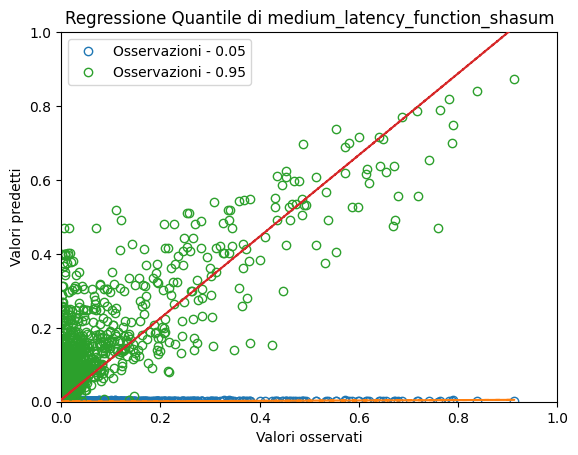

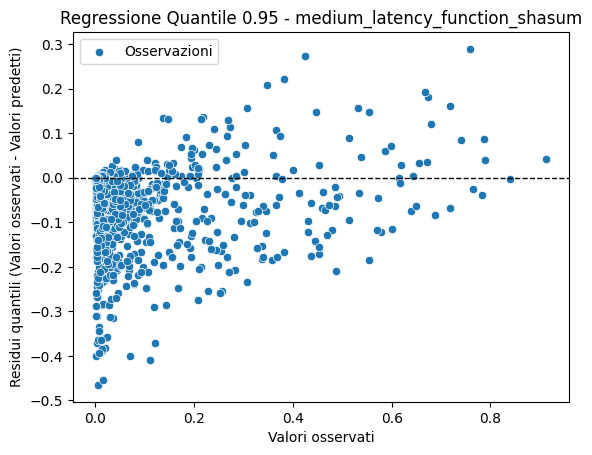

mape: 2.3453575175254873
mse: 4.845588172010575e+17
rmse: 696102591.0029767
R-squared score: 0.4821474403776048
Standard deviation: 1261082120.0597618
Quantile loss with library:  15691682.219313236
------------------------------
Target: cpu_usage_function_curl
mape: 0.07699355370305558
mse: 0.0005210904615724268
rmse: 0.022827405931739743
R-squared score: 0.986308942277584
Standard deviation: 0.19332330616298612


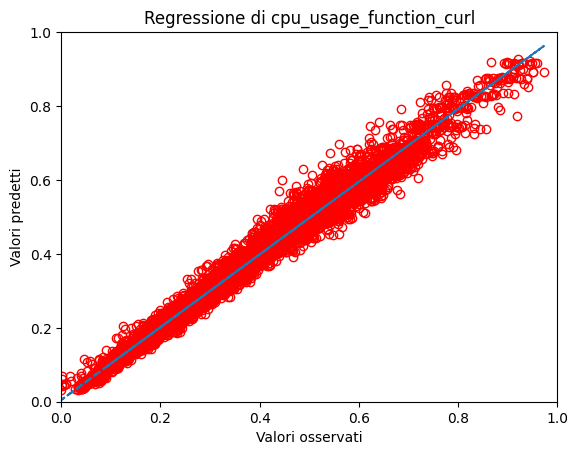

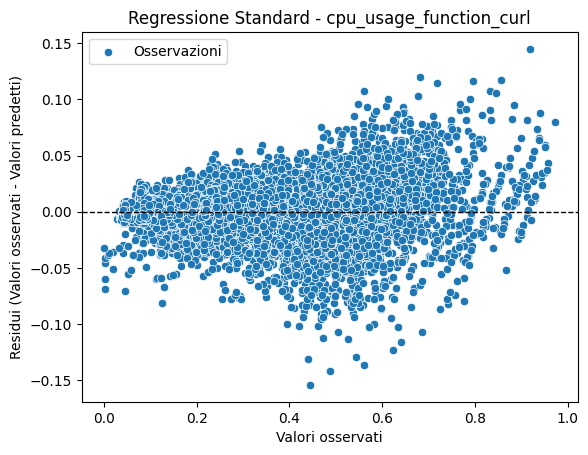

mape: 0.07089181301148033
mse: 8.712384695204896
rmse: 2.9516748965976753
R-squared score: 0.986308942277584
Standard deviation: 24.997476780098758
Quantile loss with library:  0.9978197818851078
------------------------------
Target: cpu_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.300085332321988 % of cases and less or equal in 94.69991466767802 % of cases.
mape: 0.12380288913059903
mse: 0.004724044812807732
rmse: 0.06873168710869632
R-squared score: 0.8758811089723987
Standard deviation: 0.15618409367186978
Quantile loss with library:  0.002492935779874529
Prediction for alpha 0.95 are greater than true values in 95.26879681425999 % of cases and less or equal in 4.731203185740021 % of cases.
mape: 0.2600705622380307
mse: 0.0023440238961254523
rmse: 0.04841512053197278
R-squared score: 0.9384134448215851
Standard deviation: 0.20535704748301684
Quantile loss with library:  0.00220895768220973


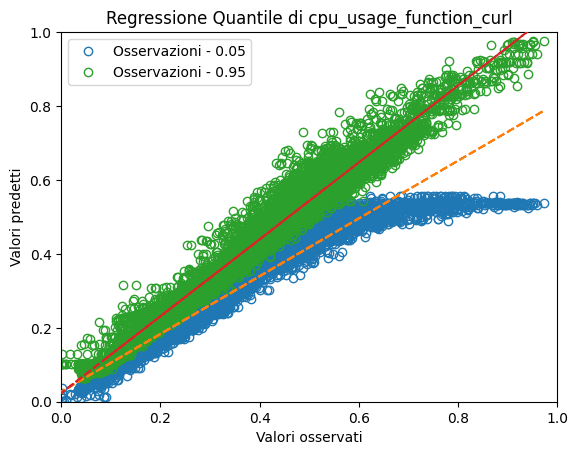

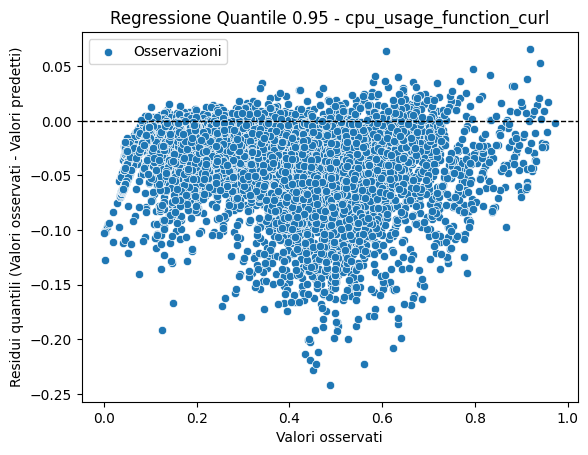

mape: 0.24204981600830294
mse: 39.19096476295693
rmse: 6.260268745266207
R-squared score: 0.9384134448215851
Standard deviation: 26.553487667744005
Quantile loss with library:  0.2856270641404469
------------------------------
Target: ram_usage_function_curl
mape: 122743609978.44856
mse: 0.02711010769240944
rmse: 0.1646514733988416
R-squared score: 0.6320518331217503
Standard deviation: 0.2086124776982667


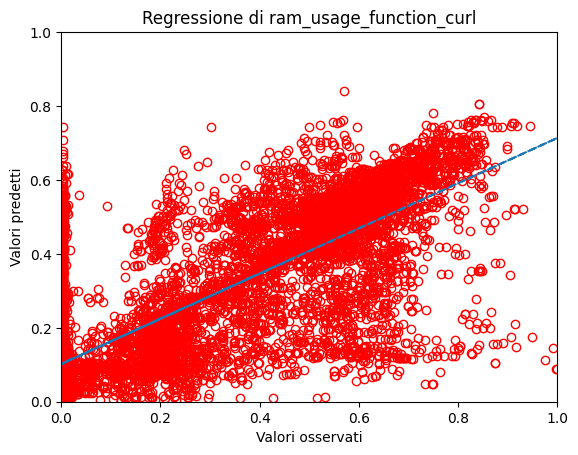

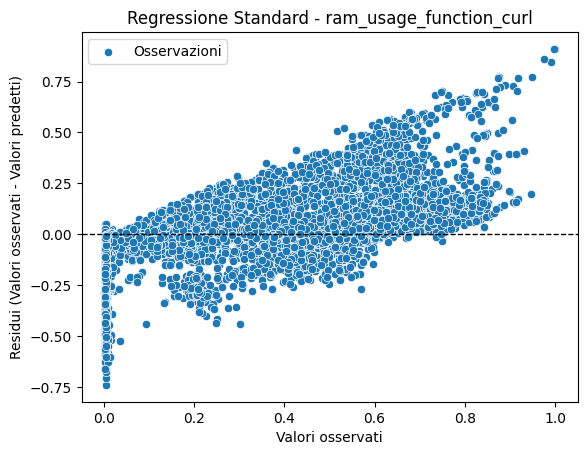

mape: 8.083004886161532
mse: 2259619909095887.5
rmse: 47535459.49179294
R-squared score: 0.6320518331217502
Standard deviation: 60227156.05518708
Quantile loss with library:  16555562.28840532
------------------------------
Target: ram_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.59400777472267 % of cases and less or equal in 94.40599222527733 % of cases.
mape: 592900501.9711721
mse: 0.09487721249839776
rmse: 0.308021448114247
R-squared score: -0.287707773550381
Standard deviation: 0.11620882404570966
Quantile loss with library:  0.011374516883716115
Prediction for alpha 0.95 are greater than true values in 94.794728358775 % of cases and less or equal in 5.205271641224993 % of cases.
mape: 266926808452.03275
mse: 0.11417465474730308
rmse: 0.3378974026939288
R-squared score: -0.5496196250813752
Standard deviation: 0.19735943650778226
Quantile loss with library:  0.014601980596513454


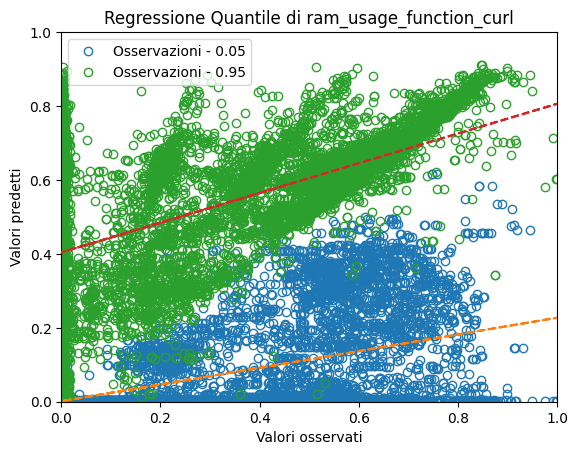

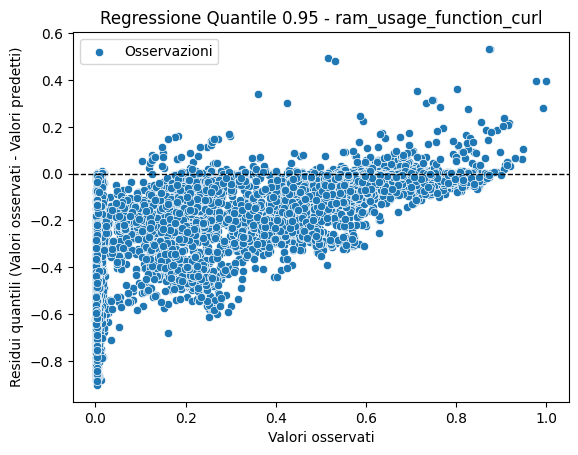

mape: 31.142407952230585
mse: 9516425604365652.0
rmse: 97552168.62974218
R-squared score: -0.5496196250813759
Standard deviation: 56978363.48365632
Quantile loss with library:  4215643.157131902
------------------------------
Target: power_usage_function_curl
mape: 0.1216908173801683
mse: 0.0012071075818129277
rmse: 0.034743453797988016
R-squared score: 0.9514925784516371
Standard deviation: 0.1543413080286524


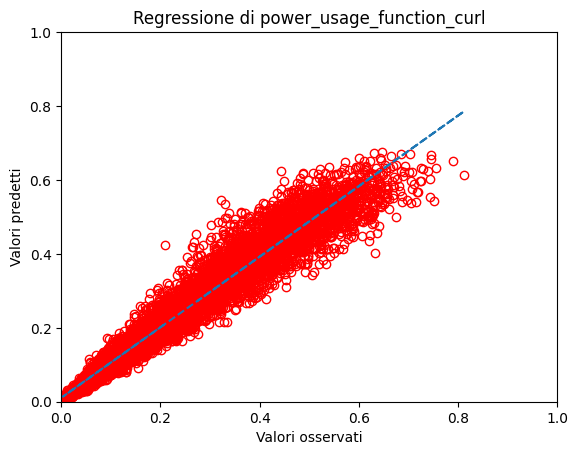

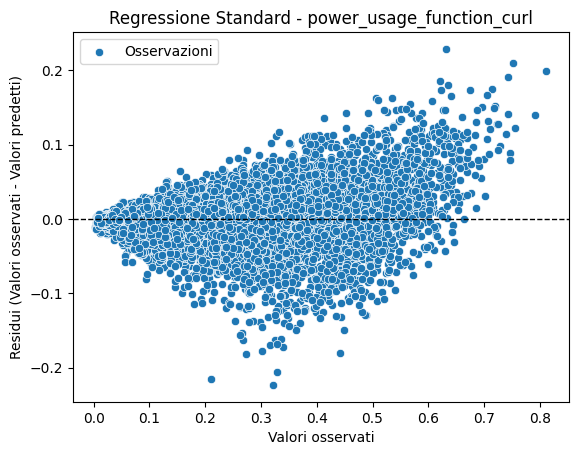

mape: 0.10917384480496746
mse: 19958001.826892342
rmse: 4467.437948857526
R-squared score: 0.9514925784516371
Standard deviation: 19845.759162937335
Quantile loss with library:  1458.239414238275
------------------------------
Target: power_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.575045036503271 % of cases and less or equal in 94.42495496349673 % of cases.
mape: 0.21397063618998938
mse: 0.004795837787114269
rmse: 0.06925198760407003
R-squared score: 0.8072800397229447
Standard deviation: 0.12117181287032397
Quantile loss with library:  0.0030003931160981876
Prediction for alpha 0.95 are greater than true values in 94.20688347397365 % of cases and less or equal in 5.793116526026358 % of cases.
mape: 0.3093285430410577
mse: 0.0047411278479324095
rmse: 0.06885584832047609
R-squared score: 0.8094785497172189
Standard deviation: 0.18348716225793207
Quantile loss with library:  0.003247266957019558


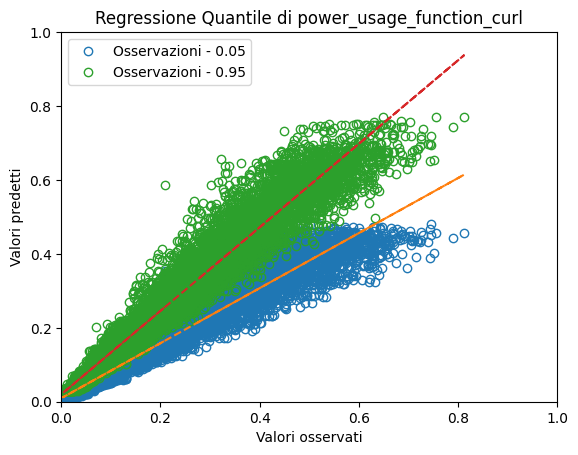

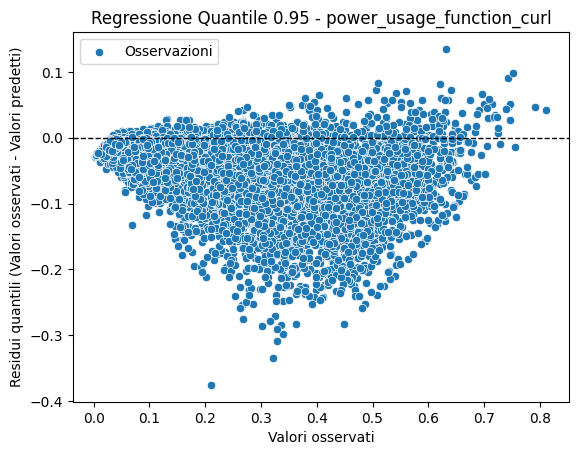

mape: 0.2683840282492932
mse: 78388570.89146304
rmse: 8853.73203183059
R-squared score: 0.8094785497172188
Standard deviation: 23593.43767506309
Quantile loss with library:  417.54523652741665
------------------------------
Target: medium_latency_function_curl
mape: 0.35581130827466123
mse: 0.0007078100667231666
rmse: 0.02660470008707421
R-squared score: 0.9866239337207039
Standard deviation: 0.2261168883420795


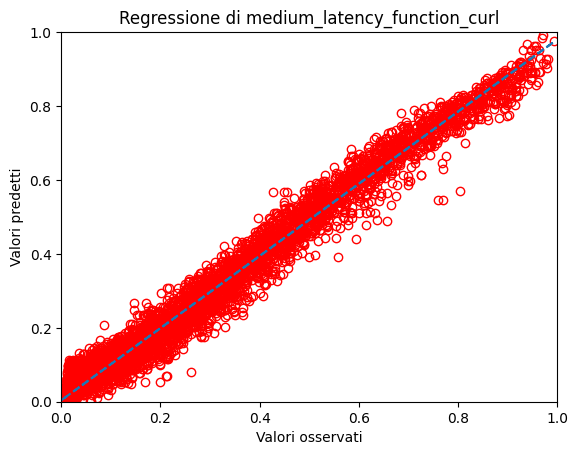

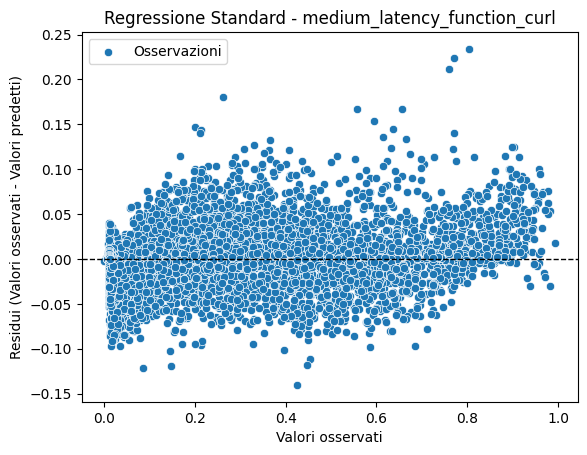

mape: 0.292880283795996
mse: 5.531440267370132e+17
rmse: 743736530.4575359
R-squared score: 0.9866239337207039
Standard deviation: 6321115797.696876
Quantile loss with library:  222154912.68106258
------------------------------
Target: medium_latency_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.8120792642457575 % of cases and less or equal in 94.18792073575423 % of cases.
mape: 0.3083742047987502
mse: 0.025364860915581558
rmse: 0.15926349523849323
R-squared score: 0.5206594583449962
Standard deviation: 0.11410281627557937
Quantile loss with library:  0.004173803514286887
Prediction for alpha 0.95 are greater than true values in 96.16952687968143 % of cases and less or equal in 3.8304731203185742 % of cases.
mape: 2.407650006166859
mse: 0.013700827489654448
rmse: 0.11705053391443564
R-squared score: 0.7410842467510469
Standard deviation: 0.2482498515257121
Quantile loss with library:  0.004123550121113498


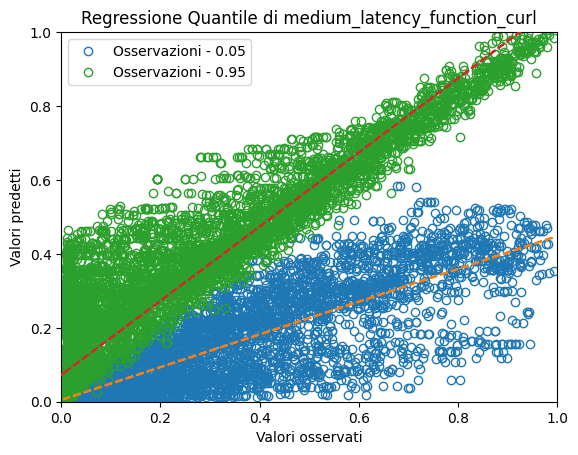

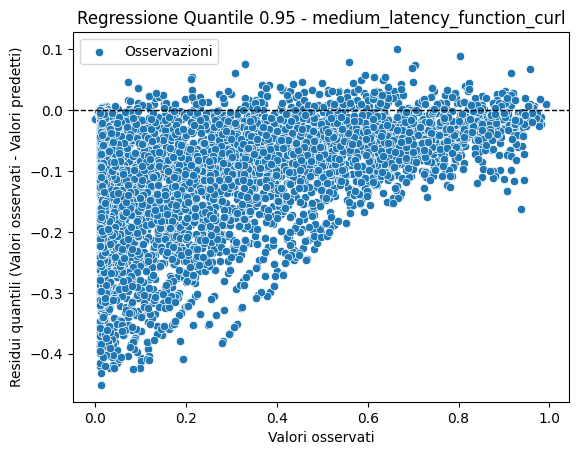

mape: 1.9739064386414769
mse: 1.0707012012900184e+19
rmse: 3272157088.664935
R-squared score: 0.7410842467510468
Standard deviation: 6939844563.406092
Quantile loss with library:  115274175.24750501
------------------------------
Target: cpu_usage_function_eat-memory
mape: 26115958081.95665
mse: 0.00031660901869044684
rmse: 0.017793510578029477
R-squared score: 0.9886060393603564
Standard deviation: 0.1656494457834276


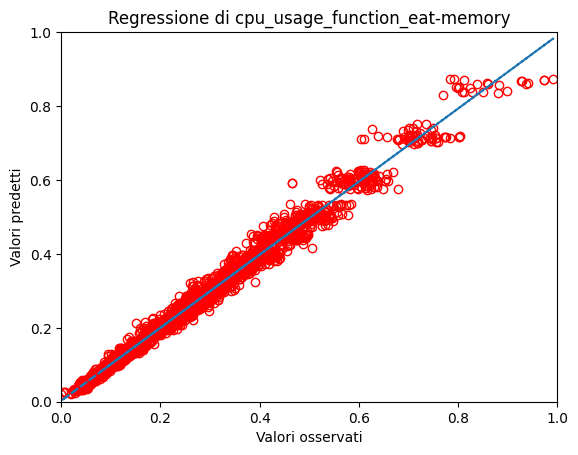

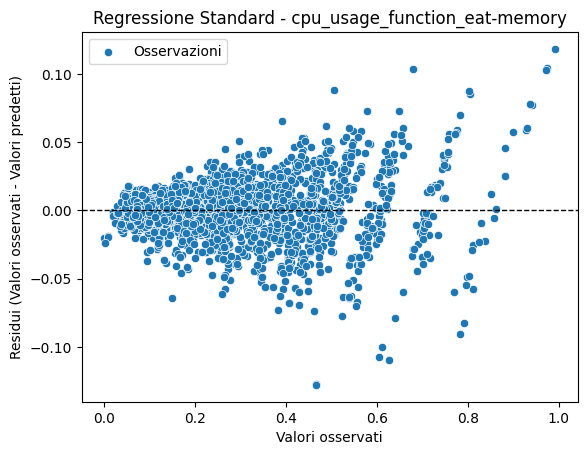

mape: 0.04903051930014429
mse: 29.704159984741928
rmse: 5.450152290050428
R-squared score: 0.9886060393603564
Standard deviation: 50.73842524346387
Quantile loss with library:  1.7945876334394604
------------------------------
Target: cpu_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 5.075406032482599 % of cases and less or equal in 94.9245939675174 % of cases.
mape: 1482545386.1592126
mse: 0.0022337387556649905
rmse: 0.04726244551083863
R-squared score: 0.9196133718282441
Standard deviation: 0.1388278189339951
Quantile loss with library:  0.0017363864232833336
Prediction for alpha 0.95 are greater than true values in 94.7215777262181 % of cases and less or equal in 5.278422273781903 % of cases.
mape: 110863990063.70412
mse: 0.0011918979063813059
rmse: 0.03452387444046954
R-squared score: 0.9571065982644669
Standard deviation: 0.17756712115537293
Quantile loss with library:  0.001567068279636904


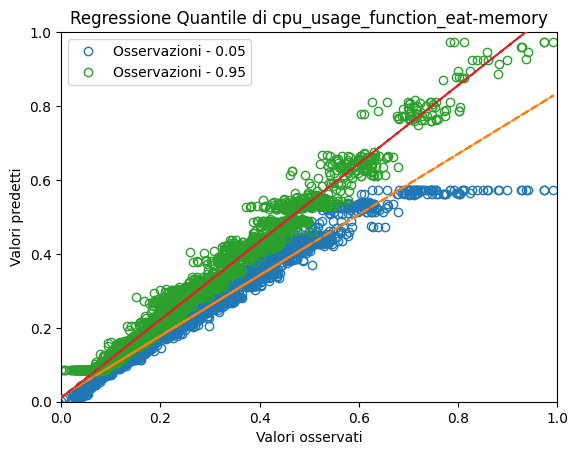

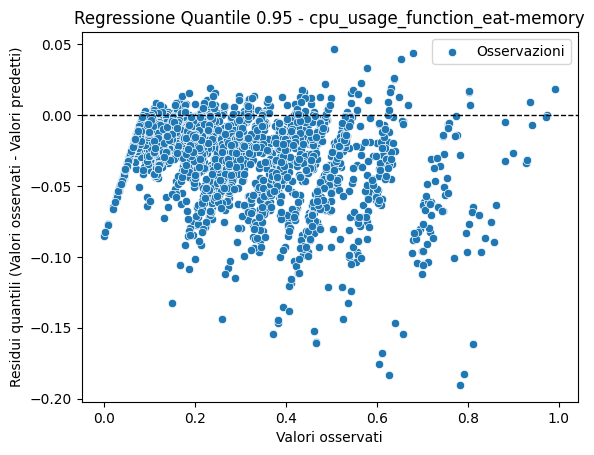

mape: 0.12828131213298868
mse: 111.82349208834314
rmse: 10.57466274111582
R-squared score: 0.9571065982644669
Standard deviation: 54.38880920989073
Quantile loss with library:  0.4799930140527837
------------------------------
Target: ram_usage_function_eat-memory
mape: 5.147559179937694
mse: 0.0070648558785100304
rmse: 0.08405269703293304
R-squared score: 0.7723792809786691
Standard deviation: 0.1528378820404611


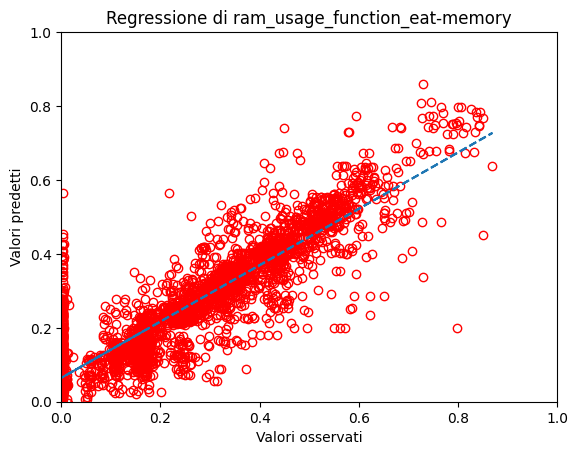

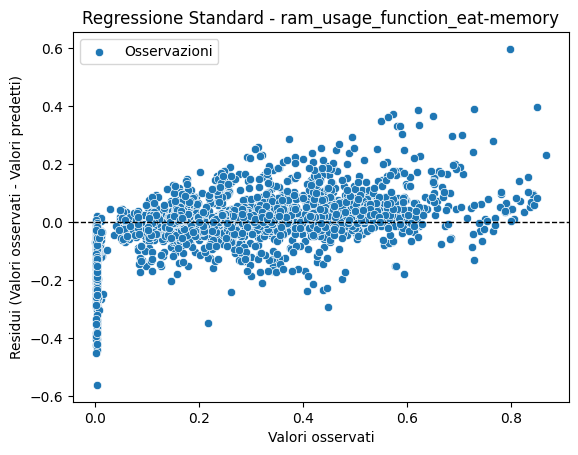

mape: 2.3111860324080427
mse: 729939655550254.0
rmse: 27017395.424989693
R-squared score: 0.7723792809786691
Standard deviation: 49127293.24303724
Quantile loss with library:  8582687.015891833
------------------------------
Target: ram_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 5.713457076566125 % of cases and less or equal in 94.28654292343387 % of cases.
mape: 0.7732385170275249
mse: 0.033683059428154305
rmse: 0.18352945111930757
R-squared score: -0.0852255640764259
Standard deviation: 0.12637568238821623
Quantile loss with library:  0.007900246064439134
Prediction for alpha 0.95 are greater than true values in 93.70649651972158 % of cases and less or equal in 6.293503480278423 % of cases.
mape: 12.213017081862809
mse: 0.02203595255659772
rmse: 0.1484451163110384
R-squared score: 0.2900294851718134
Standard deviation: 0.1602640893378691
Quantile loss with library:  0.005372522756975549


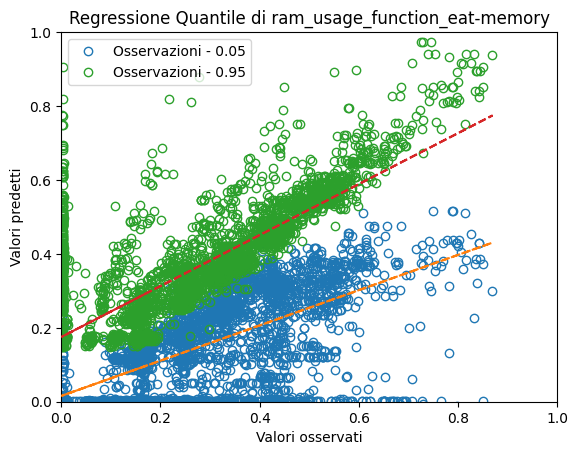

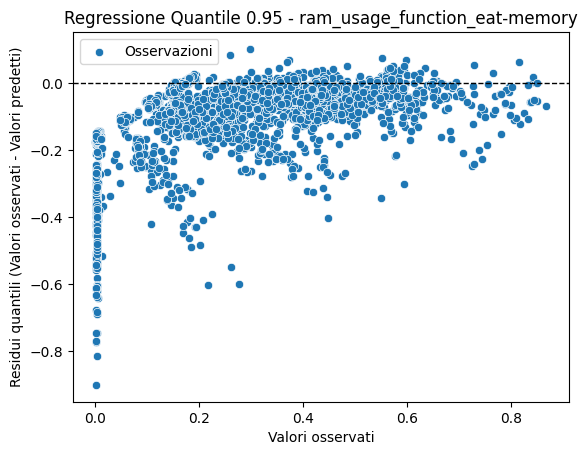

mape: 5.452915579005773
mse: 2276750707372812.0
rmse: 47715308.94139545
R-squared score: 0.2900294851718134
Standard deviation: 51514328.83076388
Quantile loss with library:  1726911.5314418972
------------------------------
Target: power_usage_function_eat-memory
mape: 0.12876892570299595
mse: 0.0006052240749397488
rmse: 0.02460130230170242
R-squared score: 0.9580592683358997
Standard deviation: 0.11967579010415526


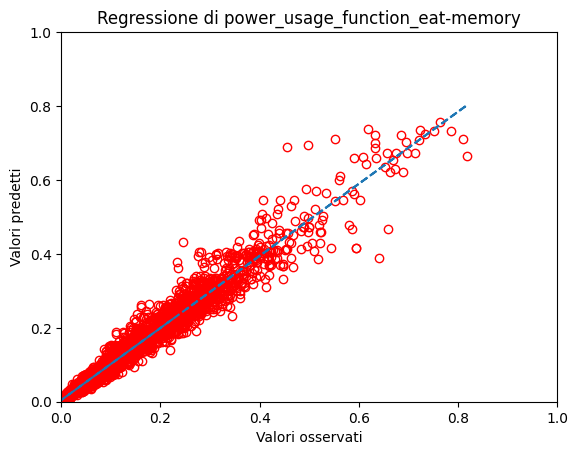

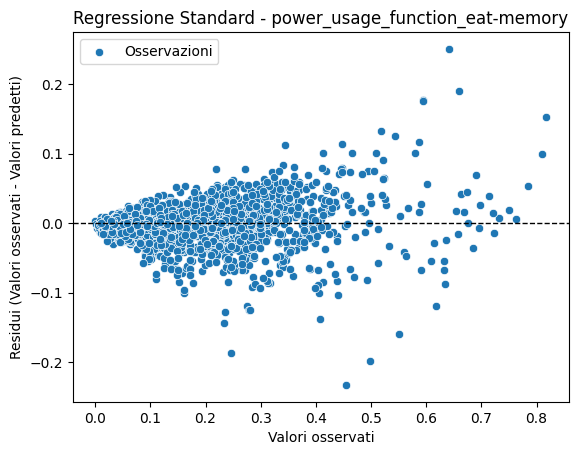

mape: 0.10059348006234242
mse: 2035673.6919396732
rmse: 1426.7703711318347
R-squared score: 0.9580592683358997
Standard deviation: 6940.684251930239
Quantile loss with library:  406.430593354647
------------------------------
Target: power_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 6.380510440835267 % of cases and less or equal in 93.61948955916473 % of cases.
mape: 0.2137868005315502
mse: 0.0024941103121798825
rmse: 0.04994106839245515
R-squared score: 0.8271634991482859
Standard deviation: 0.09031657422365717
Quantile loss with library:  0.002023564752582236
Prediction for alpha 0.95 are greater than true values in 94.11252900232019 % of cases and less or equal in 5.887470997679815 % of cases.
mape: 0.3490670188727303
mse: 0.0023836916366835304
rmse: 0.04882306459741677
R-squared score: 0.8348152767814855
Standard deviation: 0.14073040878968895
Quantile loss with library:  0.0022130680473644005


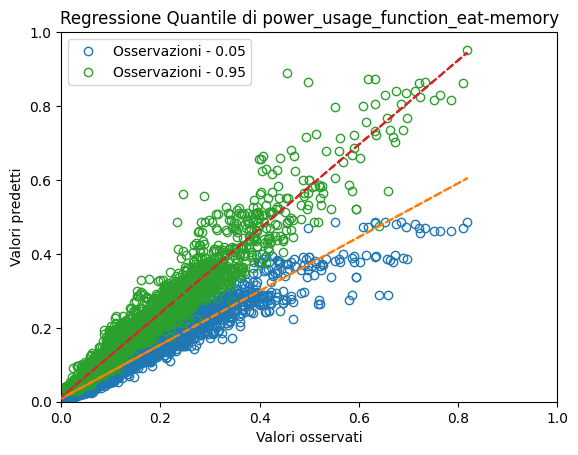

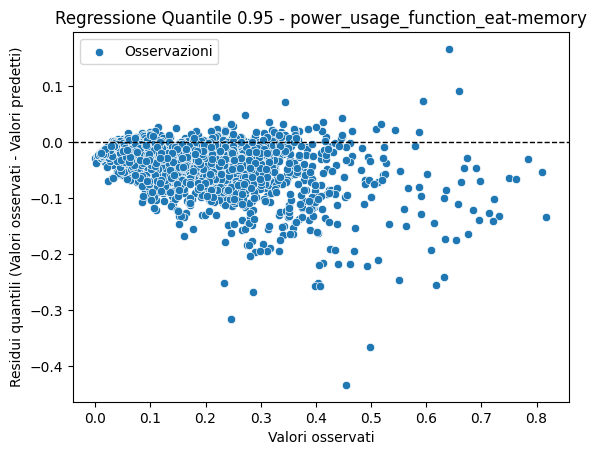

mape: 0.24929374813802918
mse: 8017556.728846837
rmse: 2831.5290443233735
R-squared score: 0.8348152767814855
Standard deviation: 8161.76213421452
Quantile loss with library:  128.3484866189221
------------------------------
Target: medium_latency_function_eat-memory
mape: 2.1662143454324085
mse: 0.001250262213836483
rmse: 0.03535904712851413
R-squared score: 0.9632065099061494
Standard deviation: 0.1747904923497449


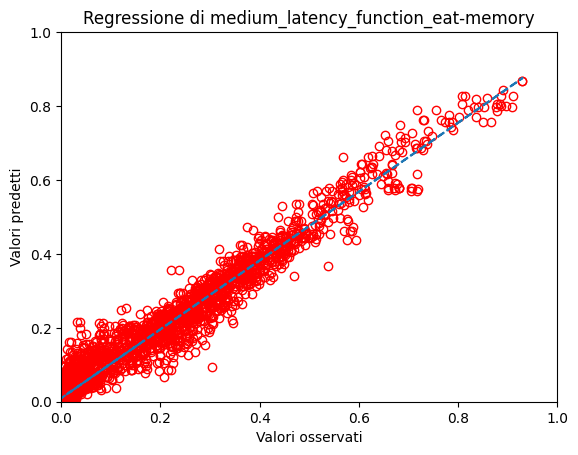

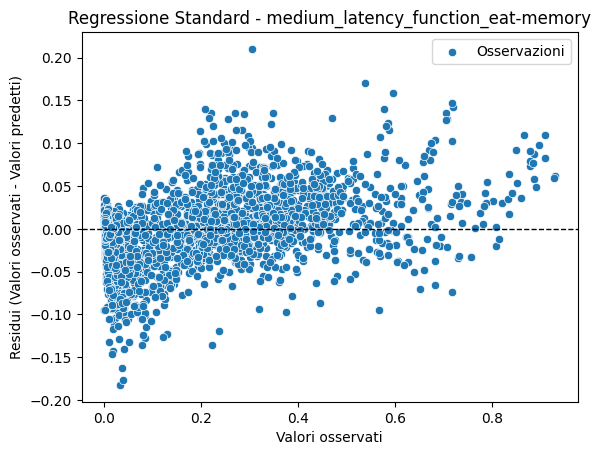

mape: 0.21171129087821847
mse: 8.631195486026401e+17
rmse: 929042274.9275945
R-squared score: 0.9632065099061494
Standard deviation: 4592537690.795664
Quantile loss with library:  298669990.7800699
------------------------------
Target: medium_latency_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 6.844547563805105 % of cases and less or equal in 93.15545243619489 % of cases.
mape: 0.608501951454156
mse: 0.02344033225348827
rmse: 0.1531023587456714
R-squared score: 0.3101833975140166
Standard deviation: 0.0808064927942665
Quantile loss with library:  0.004661161638878579
Prediction for alpha 0.95 are greater than true values in 95.21461716937355 % of cases and less or equal in 4.78538283062645 % of cases.
mape: 18.759906116790884
mse: 0.019563150107825403
rmse: 0.13986833132566287
R-squared score: 0.4242835129056174
Standard deviation: 0.176853490514119
Quantile loss with library:  0.00600087369791595


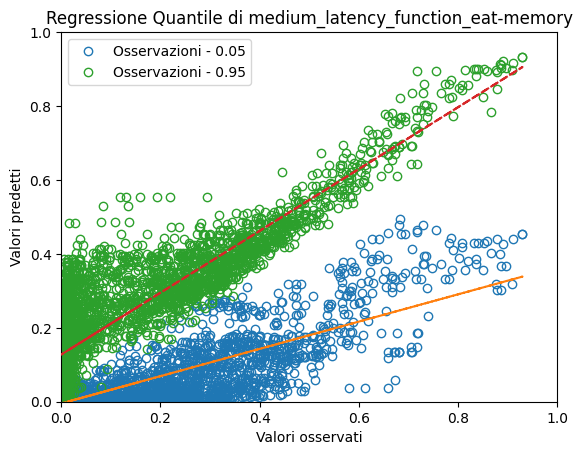

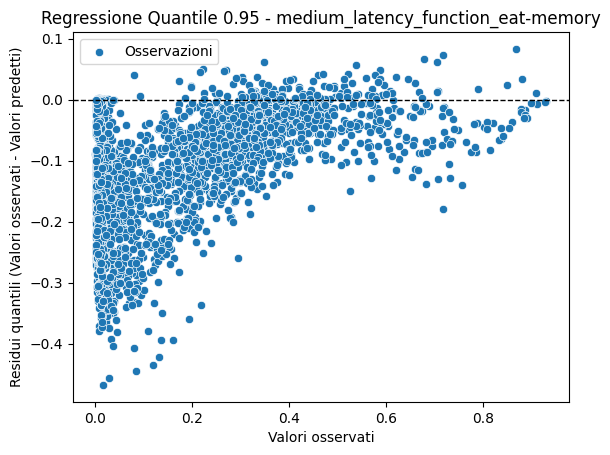

mape: 1.5292794729892238
mse: 1.35054367823359e+19
rmse: 3674974392.0653243
R-squared score: 0.4242835129056175
Standard deviation: 4646741993.893412
Quantile loss with library:  157670124.18638328
------------------------------
Target: cpu_usage_node
mape: 0.056826816333030314
mse: 0.0005548941399872776
rmse: 0.023556191117990143
R-squared score: 0.9834624857419911
Standard deviation: 0.18120479076197318


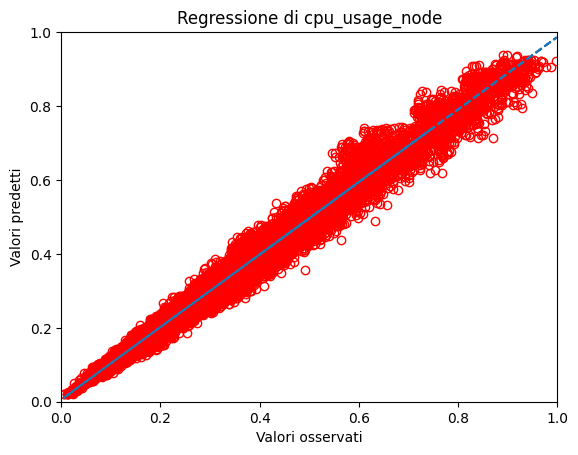

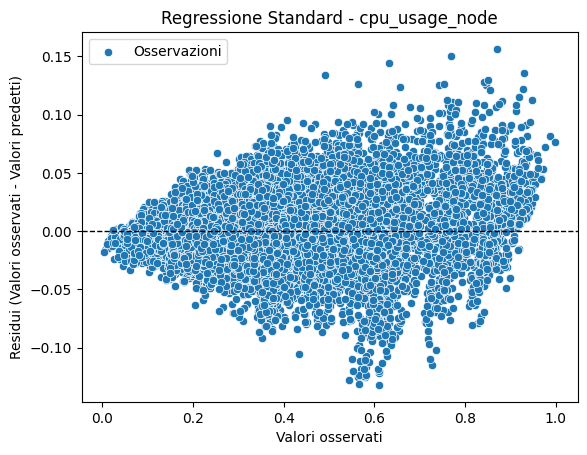

mape: 0.03573466770630755
mse: 97.00667857623048
rmse: 9.849196849298448
R-squared score: 0.9834624857419911
Standard deviation: 75.76444108944241
Quantile loss with library:  3.537903990630245
------------------------------
Target: cpu_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.474408811143505 % of cases and less or equal in 95.5255911888565 % of cases.
mape: 0.14124871287836305
mse: 0.006769631288727464
rmse: 0.08227776910397767
R-squared score: 0.7982446274142299
Standard deviation: 0.13697704644168476
Quantile loss with library:  0.0029197507617735397
Prediction for alpha 0.95 are greater than true values in 95.12066731454486 % of cases and less or equal in 4.879332685455134 % of cases.
mape: 0.2006854478264418
mse: 0.0031842851163246745
rmse: 0.05642947028215553
R-squared score: 0.9050987265535148
Standard deviation: 0.19061914714935618
Quantile loss with library:  0.0028022930271843823


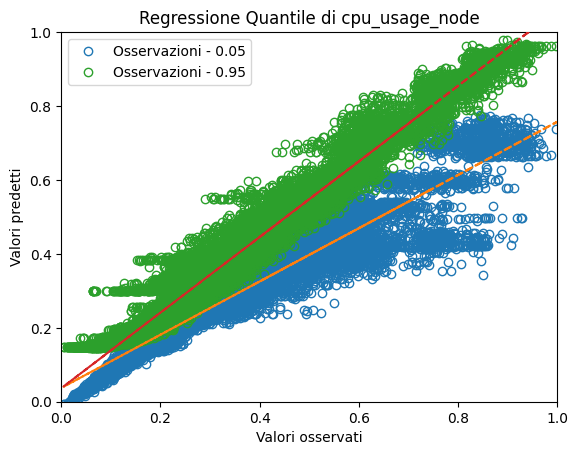

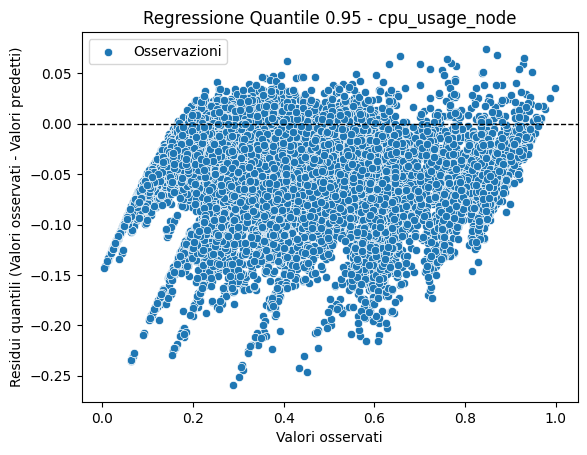

mape: 0.10988796410591956
mse: 556.6772119479664
rmse: 23.594007967023458
R-squared score: 0.9050987265535149
Standard deviation: 79.70072471035306
Quantile loss with library:  1.1716807490611978
------------------------------
Target: ram_usage_node
mape: 28840527500.459877
mse: 0.0008343315527653348
rmse: 0.028884797952648637
R-squared score: 0.9525275079856257
Standard deviation: 0.1266323594981901


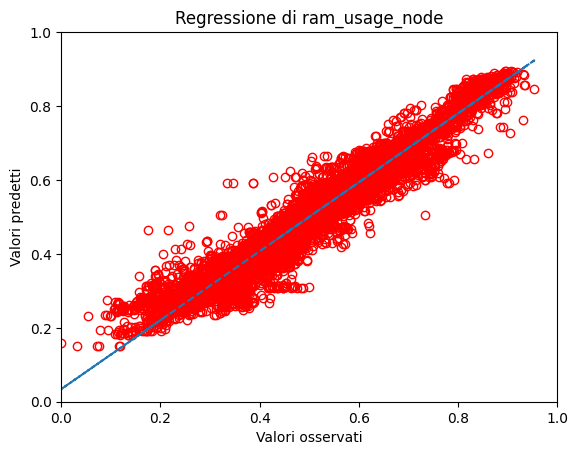

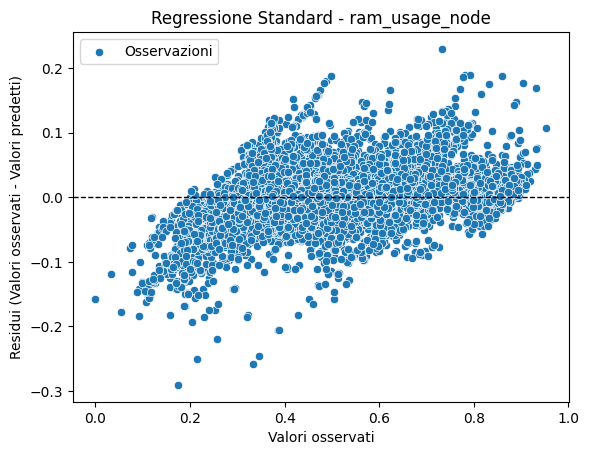

mape: 0.015339171637036356
mse: 9136999372834328.0
rmse: 95587652.82626376
R-squared score: 0.9525275079856257
Standard deviation: 419060920.42349494
Quantile loss with library:  32678040.04002355
------------------------------
Target: ram_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.814544865565273 % of cases and less or equal in 95.18545513443473 % of cases.
mape: 29458258239.05012
mse: 0.005755387886782029
rmse: 0.07586427279544719
R-squared score: 0.6725251435244074
Standard deviation: 0.11982856651183689
Quantile loss with library:  0.0031254660709702274
Prediction for alpha 0.95 are greater than true values in 95.14901198574668 % of cases and less or equal in 4.85098801425332 % of cases.
mape: 77349871828.0123
mse: 0.006164308503604692
rmse: 0.07851311039313556
R-squared score: 0.6492580374773143
Standard deviation: 0.11242664355984007
Quantile loss with library:  0.0033750445512524506


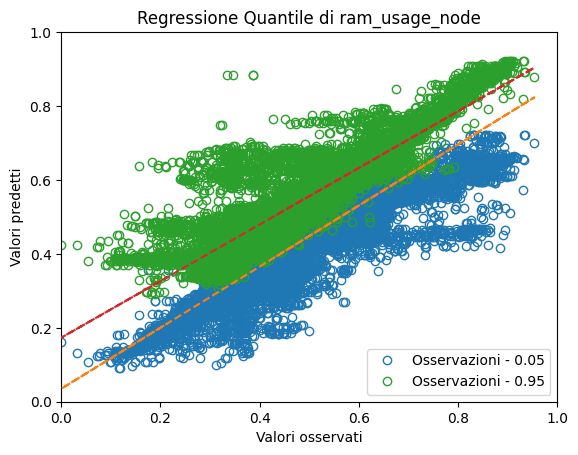

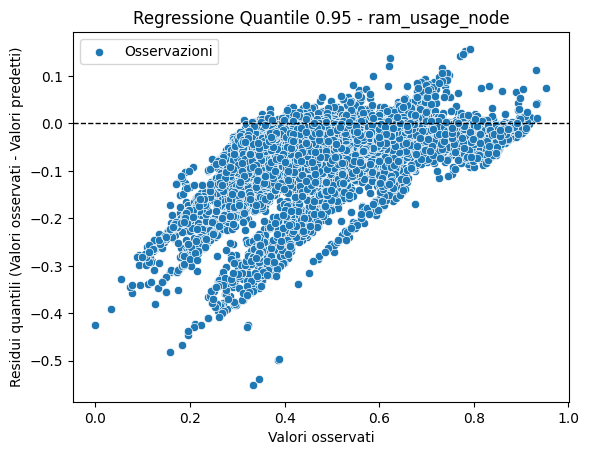

mape: 0.04480804929928888
mse: 6.750707526847539e+16
rmse: 259821237.1390672
R-squared score: 0.6492580374773143
Standard deviation: 372050342.5586423
Quantile loss with library:  11168940.40135427
------------------------------
Target: ram_usage_node_percentage
mape: 9807191258.370714
mse: 0.0003356554409589532
rmse: 0.018320901750704117
R-squared score: 0.9930720105927769
Standard deviation: 0.21879019100410022


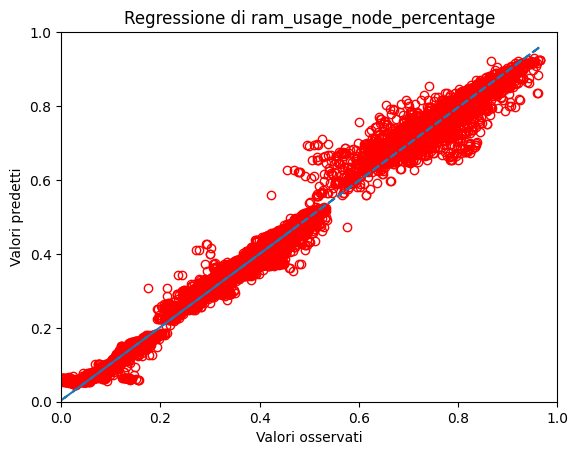

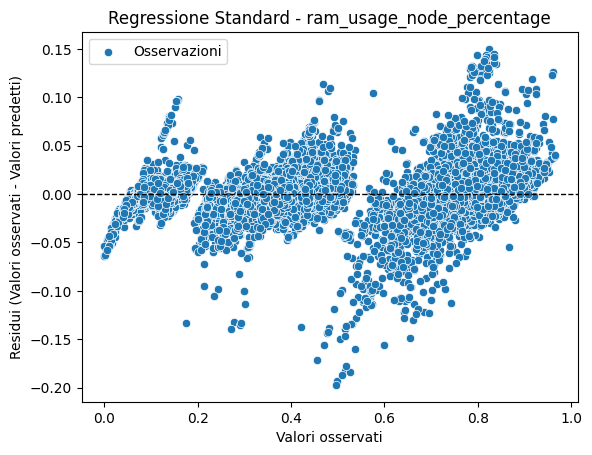

mape: 0.016206522944820057
mse: 0.6492973642304172
rmse: 0.8057899007994684
R-squared score: 0.9930720105927769
Standard deviation: 9.622830180742337
Quantile loss with library:  0.23525430182222248
------------------------------
Target: ram_usage_node_percentage quantiles
Prediction for alpha 0.05 are greater than true values in 4.174765144152899 % of cases and less or equal in 95.8252348558471 % of cases.
mape: 2434368735.077713
mse: 0.003859718513964644
rmse: 0.06212663288771285
R-squared score: 0.9203347072128059
Standard deviation: 0.18851466036457204
Quantile loss with library:  0.002084346805343085
Prediction for alpha 0.95 are greater than true values in 95.25834143181082 % of cases and less or equal in 4.74165856818918 % of cases.
mape: 23913851373.315643
mse: 0.0025578481542203155
rmse: 0.050575173298964736
R-squared score: 0.9472055484424862
Standard deviation: 0.22437992026310694
Quantile loss with library:  0.0019736900986817457


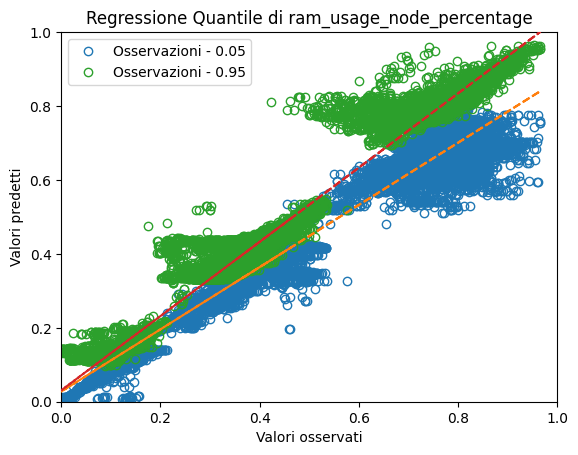

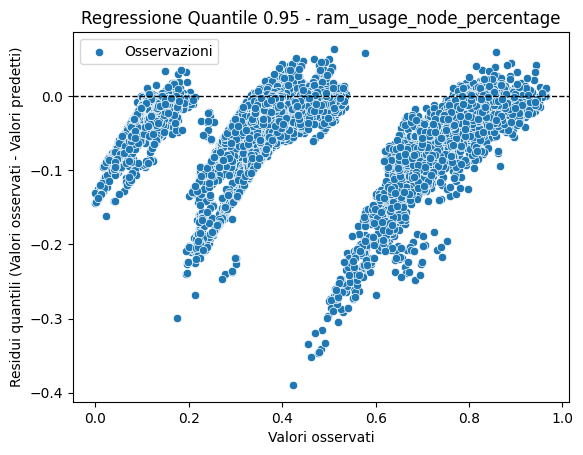

mape: 0.05636172308964674
mse: 4.947943223837047
rmse: 2.2243972720350667
R-squared score: 0.9472055484424862
Standard deviation: 9.86867765301197
Quantile loss with library:  0.08680683792022056
------------------------------
Target: power_usage_node
mape: 0.1098197600520584
mse: 0.0009906253101442447
rmse: 0.031474200706995636
R-squared score: 0.9523825342555352
Standard deviation: 0.1396911177018681


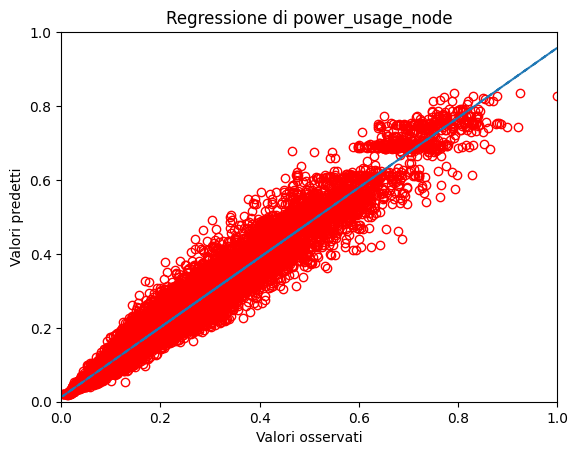

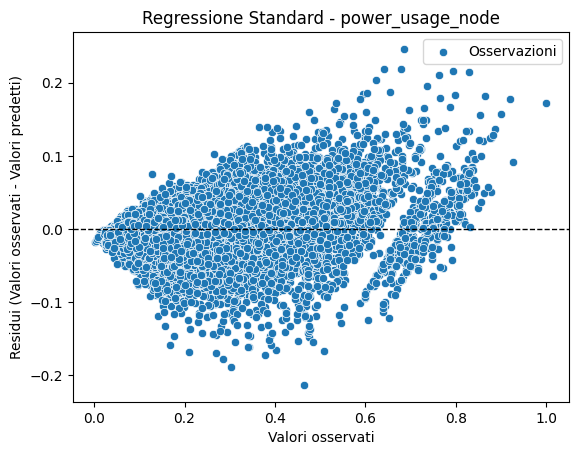

mape: 0.08984104162116038
mse: 15844764702.316792
rmse: 125875.98937969383
R-squared score: 0.9523825342555352
Standard deviation: 558672.0950270119
Quantile loss with library:  45150.305943726424
------------------------------
Target: power_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 5.231616456106252 % of cases and less or equal in 94.76838354389375 % of cases.
mape: 0.20573754058871227
mse: 0.00471927333919623
rmse: 0.06869696746724872
R-squared score: 0.7731535483025149
Standard deviation: 0.11115829084633808
Quantile loss with library:  0.002988258568121087
Prediction for alpha 0.95 are greater than true values in 94.77243278263686 % of cases and less or equal in 5.227567217363135 % of cases.
mape: 0.29070991252513173
mse: 0.003969438587295552
rmse: 0.06300348075539598
R-squared score: 0.8091966720214523
Standard deviation: 0.15591917426805754
Quantile loss with library:  0.0032323168971717425


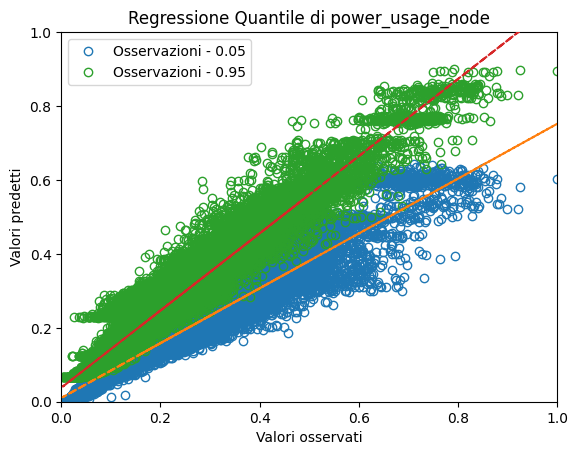

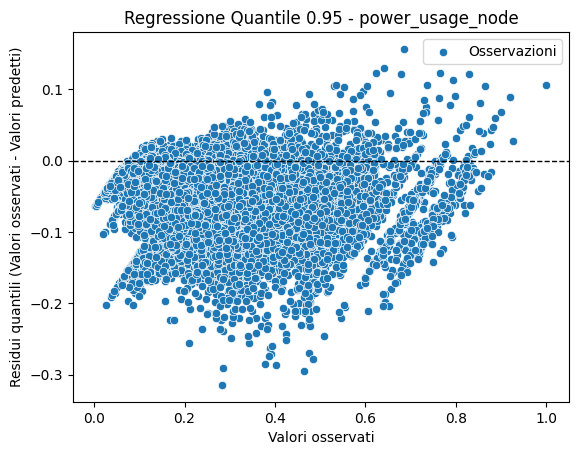

mape: 0.2280016518727378
mse: 63490019659.23596
rmse: 251972.25970180918
R-squared score: 0.8091966720214523
Standard deviation: 623573.5899051551
Quantile loss with library:  12927.130102775309
------------------------------
Target: overloaded_node
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.98     22569
           1       0.97      1.00      0.98     22801

    accuracy                           0.98     45370
   macro avg       0.98      0.98      0.98     45370
weighted avg       0.98      0.98      0.98     45370

Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.97      0.98     22569
         1.0       0.97      1.00      0.98     22801

    accuracy                           0.98     45370
   macro avg       0.98      0.98      0.98     45370
weighted avg       0.98      0.98      0.98     45370

------------------------------
Target: cpu_usage

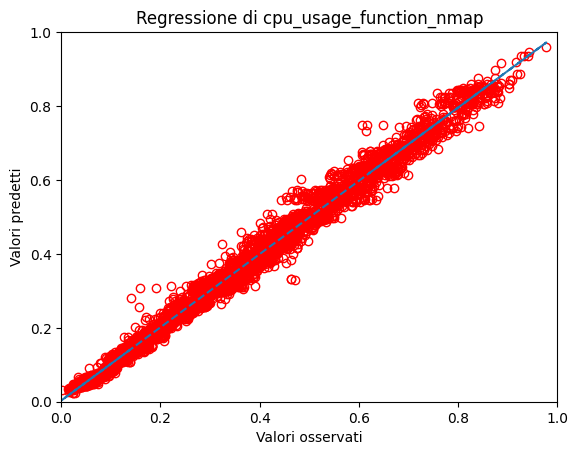

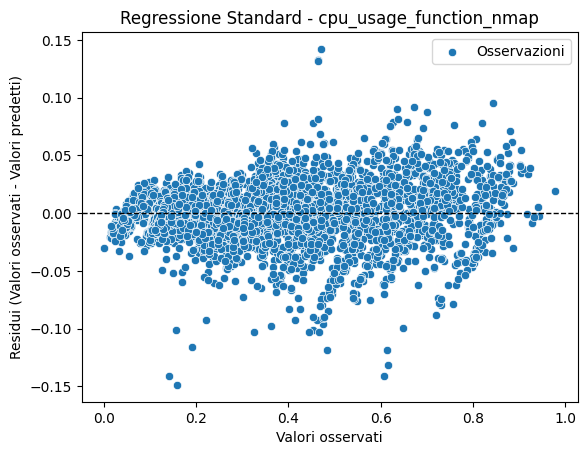

mape: 0.047292561136530686
mse: 60.72080395647506
rmse: 7.792355481911426
R-squared score: 0.9889341766011658
Standard deviation: 73.7911140866783
Quantile loss with library:  2.74979689012168
------------------------------
Target: cpu_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 5.946535733769776 % of cases and less or equal in 94.05346426623022 % of cases.
mape: 0.11804976695241728
mse: 0.002930227623187856
rmse: 0.05413157695086904
R-squared score: 0.9319073048389732
Standard deviation: 0.18245830755874973
Quantile loss with library:  0.0023961457665443294
Prediction for alpha 0.95 are greater than true values in 94.72631387525004 % of cases and less or equal in 5.273686124749954 % of cases.
mape: 0.21034978085544148
mse: 0.0023314153364573237
rmse: 0.04828473191866476
R-squared score: 0.9458225181747413
Standard deviation: 0.2139543887741602
Quantile loss with library:  0.002213274528168638


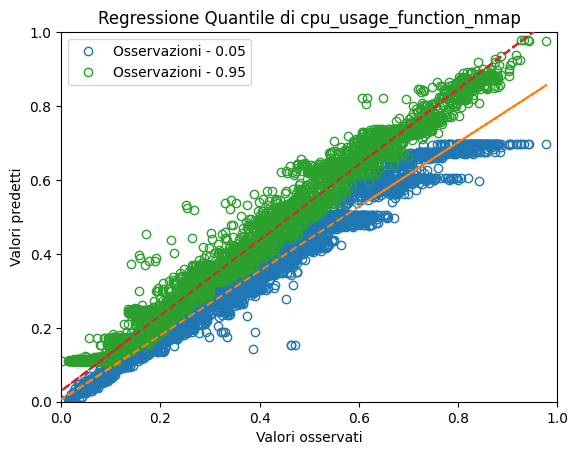

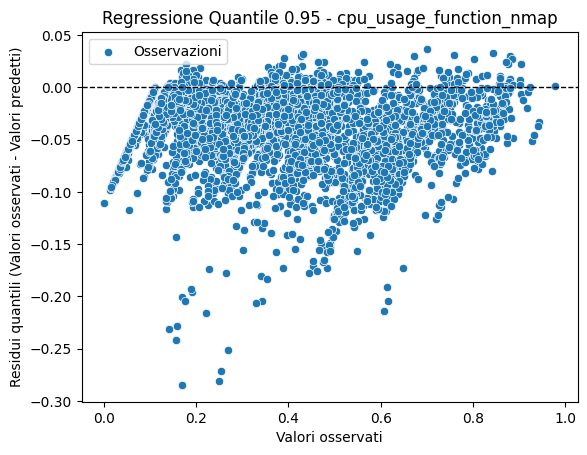

mape: 0.14174448087557254
mse: 297.2847238022608
rmse: 17.241946636104082
R-squared score: 0.9458225181747413
Standard deviation: 76.40075873297609
Quantile loss with library:  0.7903359879892107
------------------------------
Target: ram_usage_function_nmap
mape: 32.04744284749876
mse: 0.03331881061973744
rmse: 0.18253440941295818
R-squared score: 0.5766978166931921
Standard deviation: 0.1981098027295953


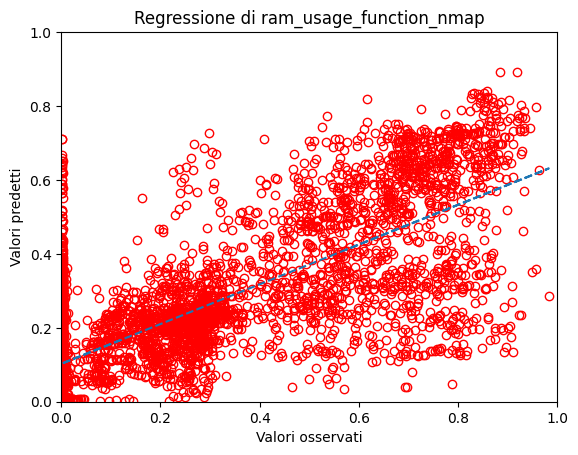

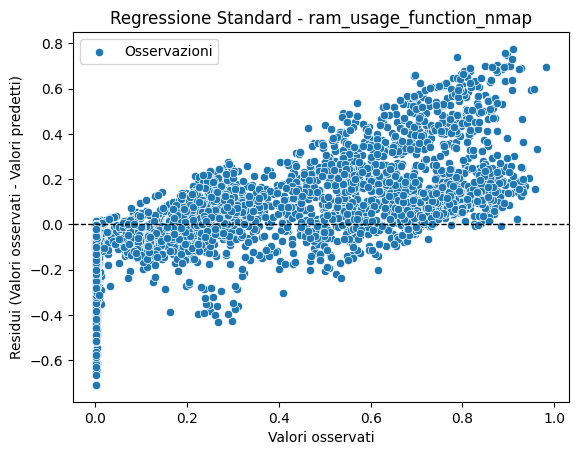

mape: 10.03895049977465
mse: 3729374813385932.5
rmse: 61068607.429561816
R-squared score: 0.576697816693192
Standard deviation: 66279502.0936076
Quantile loss with library:  21721036.288287245
------------------------------
Target: ram_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 5.655573740680123 % of cases and less or equal in 94.34442625931987 % of cases.
mape: 0.9537645983369597
mse: 0.11149119204496985
rmse: 0.3339029680086265
R-squared score: -0.41645107176056384
Standard deviation: 0.07306669240744806
Quantile loss with library:  0.0108468995157101
Prediction for alpha 0.95 are greater than true values in 94.01709401709401 % of cases and less or equal in 5.982905982905983 % of cases.
mape: 142.89839006532176
mse: 0.16252734286602108
rmse: 0.4031468006396939
R-squared score: -1.0648449870382266
Standard deviation: 0.27021954463484466
Quantile loss with library:  0.01634741302712038


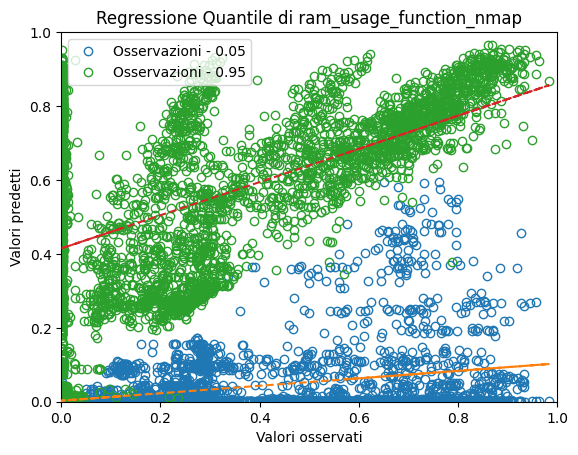

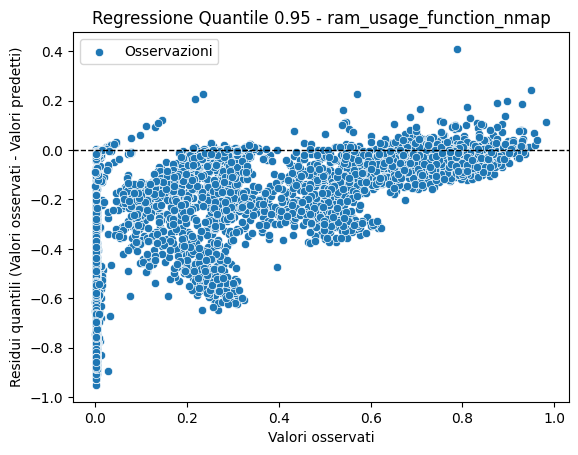

mape: 42.971350747708385
mse: 1.8191687149001096e+16
rmse: 134876562.63784713
R-squared score: -1.064844987038227
Standard deviation: 90404496.02993485
Quantile loss with library:  5469181.136054058
------------------------------
Target: power_usage_function_nmap
mape: 190743142388.83887
mse: 0.0009256352976882791
rmse: 0.030424255088469777
R-squared score: 0.9766518505207071
Standard deviation: 0.1958219250633568


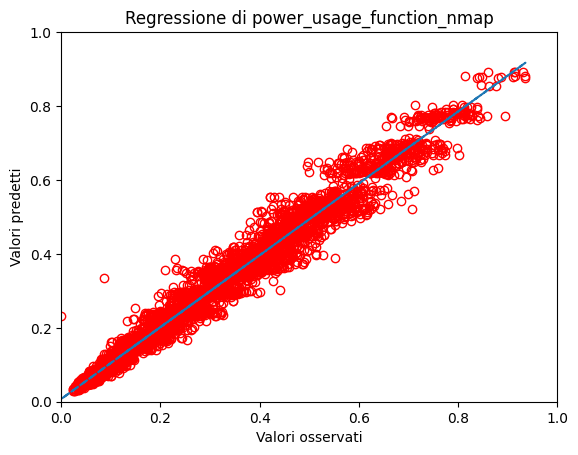

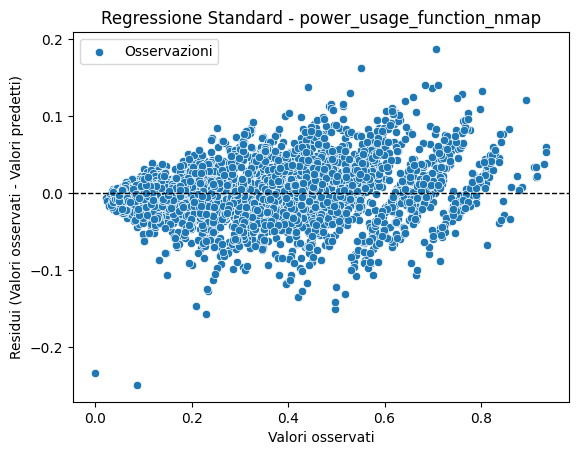

mape: 0.13909719699545767
mse: 2968325.454624258
rmse: 1722.8828905715727
R-squared score: 0.9766518505207071
Standard deviation: 11089.120943451006
Quantile loss with library:  586.2914234498617
------------------------------
Target: power_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 5.510092744135298 % of cases and less or equal in 94.48990725586471 % of cases.
mape: 138851868499.86618
mse: 0.004170747764060223
rmse: 0.06458132674434788
R-squared score: 0.8947973975507376
Standard deviation: 0.16984003538527115
Quantile loss with library:  0.002880691039102124
Prediction for alpha 0.95 are greater than true values in 94.65357337697763 % of cases and less or equal in 5.346426623022368 % of cases.
mape: 303361709823.62915
mse: 0.0037609859951814807
rmse: 0.061326878244220784
R-squared score: 0.9051331950884653
Standard deviation: 0.21628586686012088
Quantile loss with library:  0.0029238289864706147


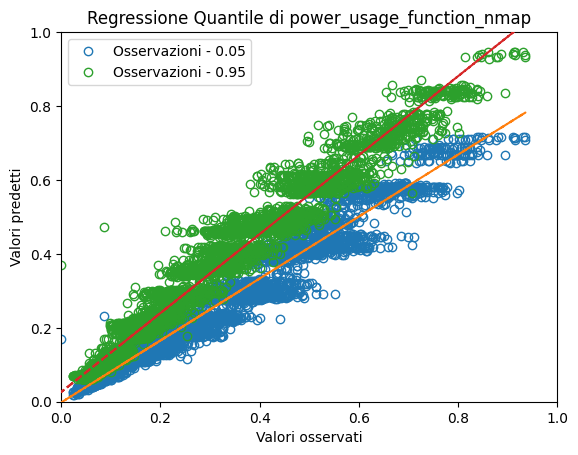

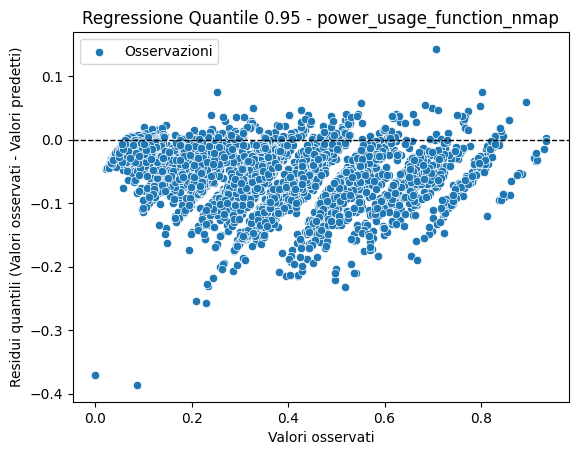

mape: 0.2996946308897611
mse: 12060722.502548857
rmse: 3472.8550938023395
R-squared score: 0.9051331950884653
Standard deviation: 12247.965263312728
Quantile loss with library:  165.57233434637254
------------------------------
Target: medium_latency_function_nmap
mape: 25455201335.116257
mse: 0.0007011112596378606
rmse: 0.026478505615647206
R-squared score: 0.9919300321888342
Standard deviation: 0.29137885285410475


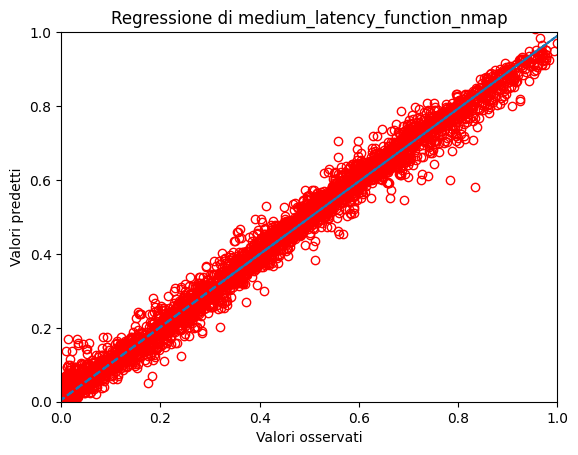

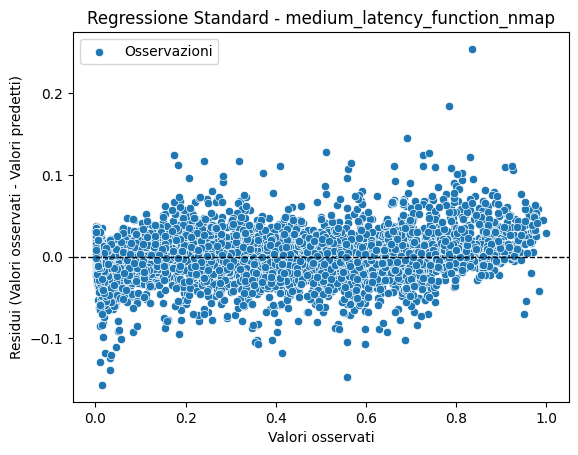

mape: 0.4266532031999091
mse: 6.086009515983306e+17
rmse: 780128804.4921368
R-squared score: 0.9919300321888342
Standard deviation: 8584813638.313282
Quantile loss with library:  261291280.01377842
------------------------------
Target: medium_latency_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 5.164575377341335 % of cases and less or equal in 94.83542462265866 % of cases.
mape: 6670787742.8601675
mse: 0.03348246581622473
rmse: 0.1829821461679383
R-squared score: 0.6146083554342594
Standard deviation: 0.2057106466193584
Quantile loss with library:  0.005800310480282759
Prediction for alpha 0.95 are greater than true values in 96.16293871613021 % of cases and less or equal in 3.837061283869794 % of cases.
mape: 38631503982.21024
mse: 0.021227777668084688
rmse: 0.14569755546365454
R-squared score: 0.7556629135117414
Standard deviation: 0.30100597048505945
Quantile loss with library:  0.004928050212391945


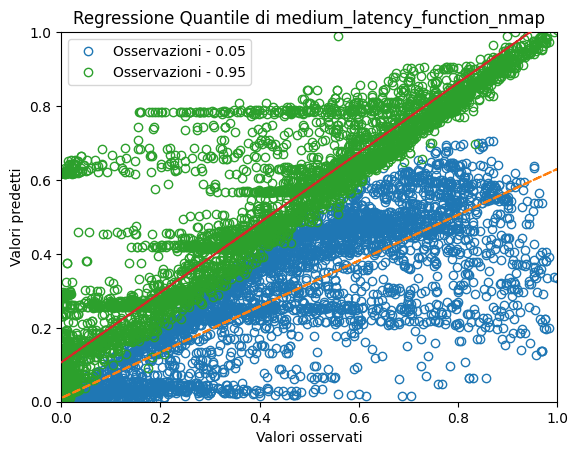

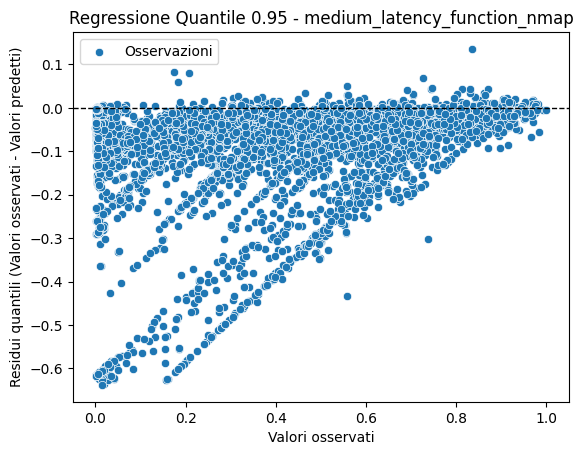

mape: 3.0908849322035907
mse: 1.842681245168878e+19
rmse: 4292646322.6882296
R-squared score: 0.7556629135117415
Standard deviation: 8868454712.215267
Quantile loss with library:  145193764.95321065
------------------------------
Target: cpu_usage_function_env
mape: 53017206164.57868
mse: 0.00029727701373899186
rmse: 0.017241723050176624
R-squared score: 0.9883818045327675
Standard deviation: 0.1589514265709385


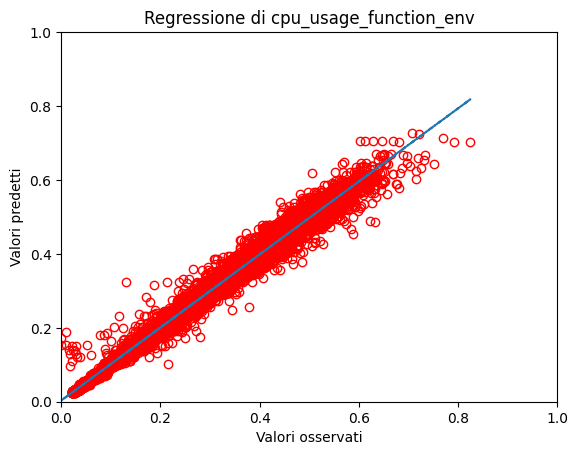

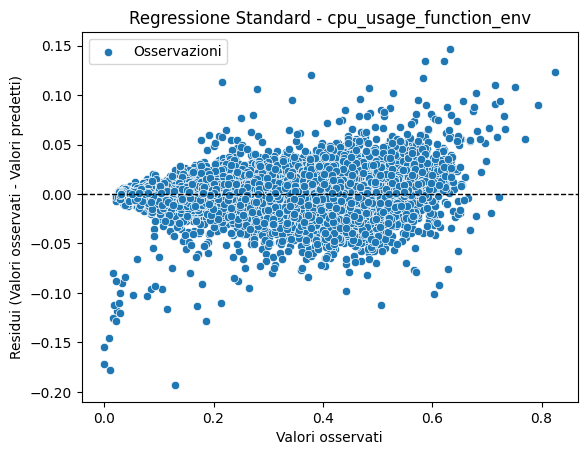

mape: 0.06974598353451894
mse: 0.31372838194560243
rmse: 0.5601146150080378
R-squared score: 0.9883818045327675
Standard deviation: 5.163696043583509
Quantile loss with library:  0.18151901615416077
------------------------------
Target: cpu_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 4.789927466812646 % of cases and less or equal in 95.21007253318736 % of cases.
mape: 24127506843.877495
mse: 0.0020534165203392666
rmse: 0.045314639139457644
R-squared score: 0.919748270446862
Standard deviation: 0.13813568595773706
Quantile loss with library:  0.0018226461481374247
Prediction for alpha 0.95 are greater than true values in 94.86793485698645 % of cases and less or equal in 5.132065143013548 % of cases.
mape: 99669652056.84811
mse: 0.0011806020541609106
rmse: 0.034359890194249905
R-squared score: 0.9538596500895266
Standard deviation: 0.16761074020700978
Quantile loss with library:  0.0016283817444581652


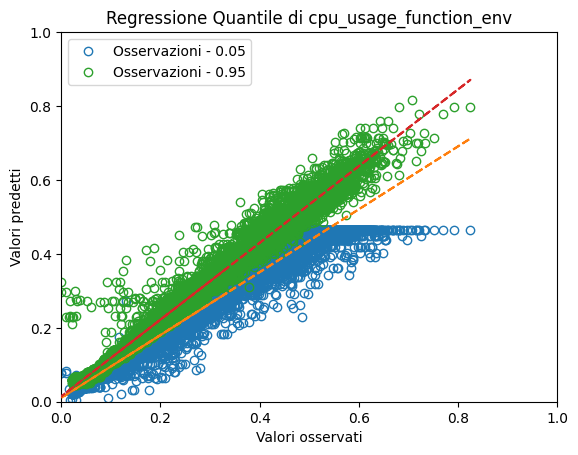

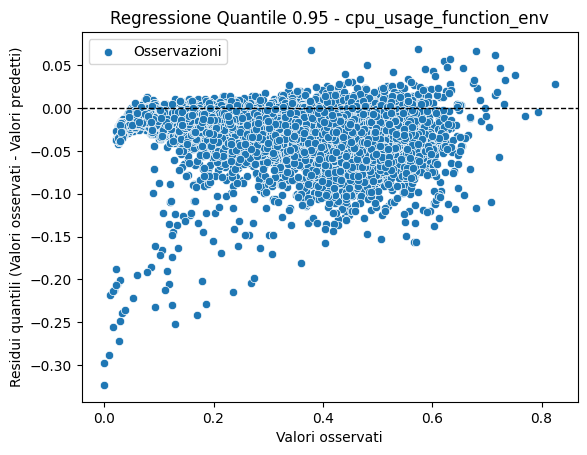

mape: 0.1973638451700565
mse: 1.2459368032361786
rmse: 1.1162153928504026
R-squared score: 0.9538596500895266
Standard deviation: 5.44500250636492
Quantile loss with library:  0.05289960935046796
------------------------------
Target: ram_usage_function_env
mape: 7.6178709897358585
mse: 0.006611782744738403
rmse: 0.08131286949024984
R-squared score: 0.8013619049734675
Standard deviation: 0.15710349488797867


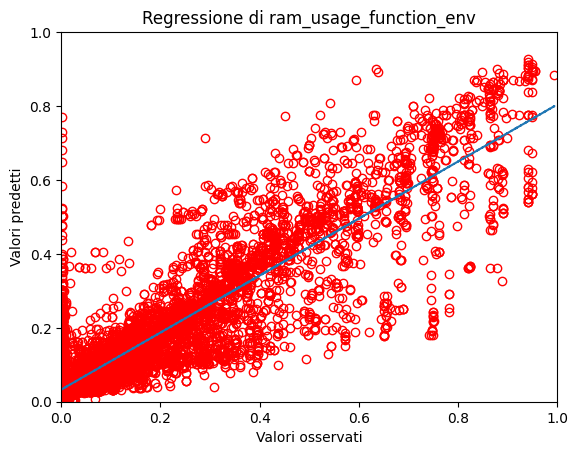

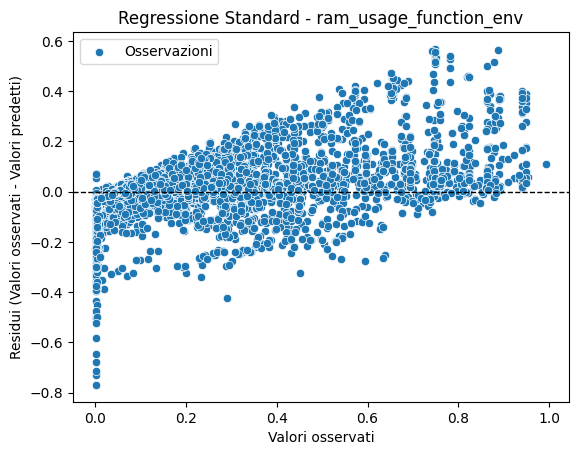

mape: 1.7951051711482033
mse: 269108557317207.38
rmse: 16404528.561260374
R-squared score: 0.8013619049734675
Standard deviation: 31694967.66157909
Quantile loss with library:  4712512.378523652
------------------------------
Target: ram_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 5.173121664157657 % of cases and less or equal in 94.82687833584235 % of cases.
mape: 0.9723003537315924
mse: 0.02965033353437225
rmse: 0.1721927220714402
R-squared score: 0.10921365726120102
Standard deviation: 0.08334090315703677
Quantile loss with library:  0.005422481431537733
Prediction for alpha 0.95 are greater than true values in 95.47693992062406 % of cases and less or equal in 4.523060079375941 % of cases.
mape: 25.184961550224592
mse: 0.030592833565457108
rmse: 0.1749080717561574
R-squared score: 0.08089808520370578
Standard deviation: 0.21011945210653452
Quantile loss with library:  0.006664083846635832


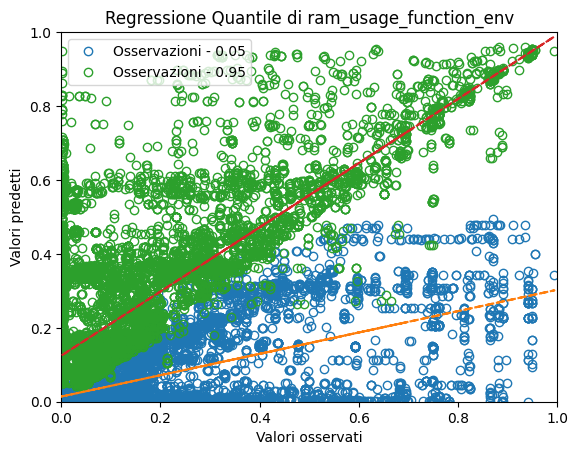

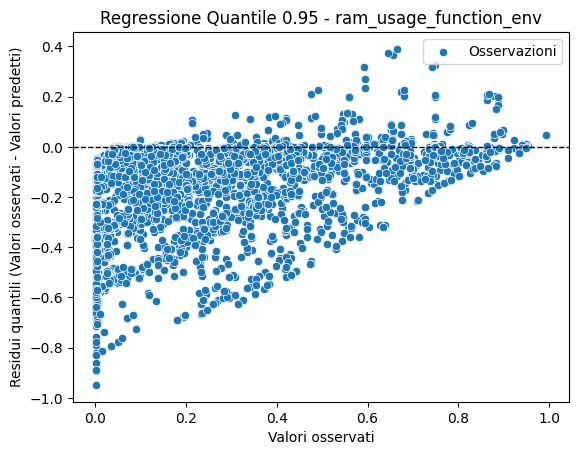

mape: 5.733655142359276
mse: 1245169967448973.2
rmse: 35286965.97114823
R-squared score: 0.08089808520370567
Standard deviation: 42390713.48688959
Quantile loss with library:  1344450.8167293253
------------------------------
Target: power_usage_function_env
mape: 0.12104228201509863
mse: 0.0010833559600067926
rmse: 0.03291437315226879
R-squared score: 0.9551525916718128
Standard deviation: 0.1510333400409262


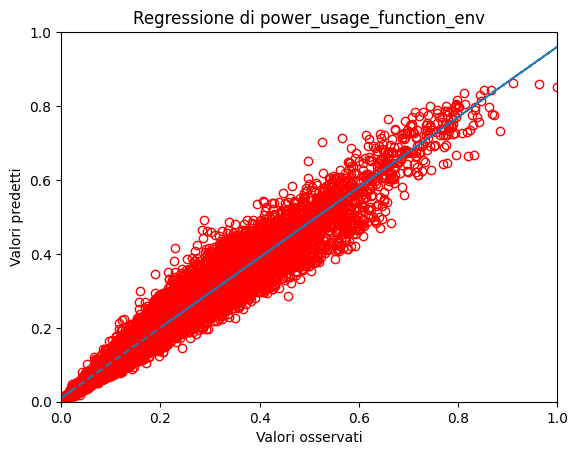

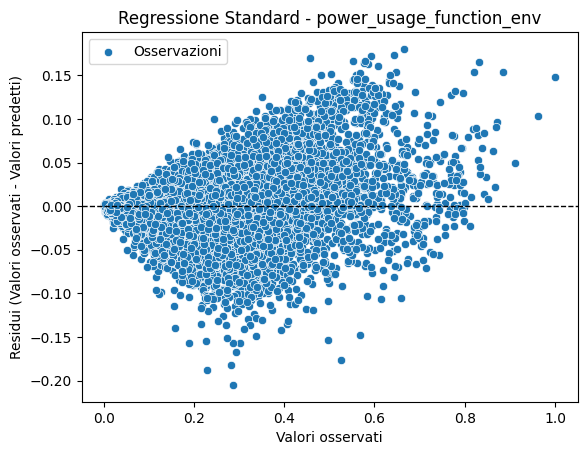

mape: 0.11165024239427349
mse: 8242102.227524361
rmse: 2870.9061683594537
R-squared score: 0.9551525916718128
Standard deviation: 13173.653514392927
Quantile loss with library:  942.5245683238176
------------------------------
Target: power_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 4.960996304913097 % of cases and less or equal in 95.0390036950869 % of cases.
mape: 0.22465941086759997
mse: 0.005647280703908218
rmse: 0.07514839122634774
R-squared score: 0.766220971664312
Standard deviation: 0.11072256122251097
Quantile loss with library:  0.0029116254864022966
Prediction for alpha 0.95 are greater than true values in 94.95689065279869 % of cases and less or equal in 5.043109347201314 % of cases.
mape: 0.36171786998107314
mse: 0.004799551835835324
rmse: 0.06927879788099187
R-squared score: 0.8013141858077213
Standard deviation: 0.17922646285270352
Quantile loss with library:  0.0031739018759384466


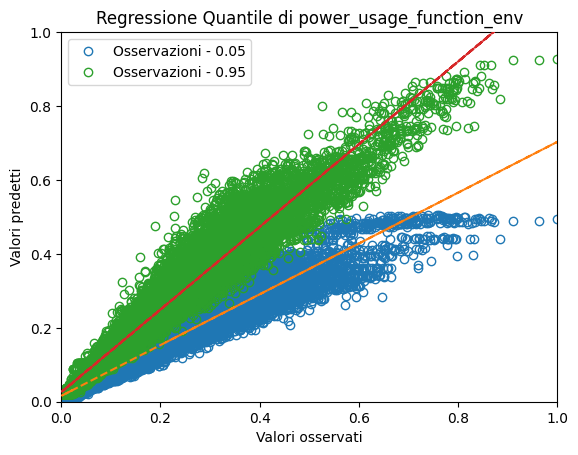

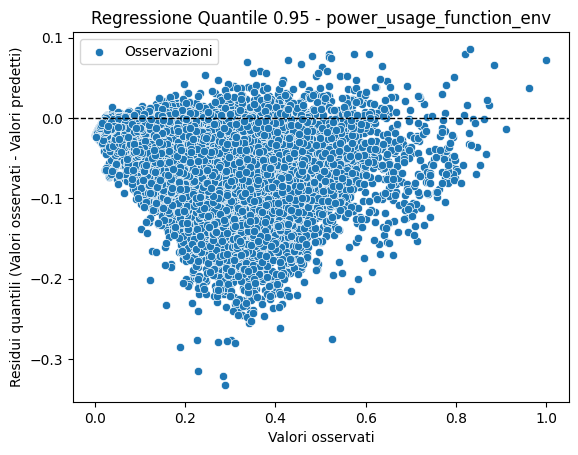

mape: 0.31707429462521536
mse: 36514680.61984809
rmse: 6042.737841396736
R-squared score: 0.8013141858077213
Standard deviation: 15632.755798103526
Quantile loss with library:  276.83876679787966
------------------------------
Target: medium_latency_function_env
mape: 1.9207543888237282
mse: 0.00020041852765374842
rmse: 0.01415692507763421
R-squared score: 0.8670740817217721
Standard deviation: 0.03456156607415845


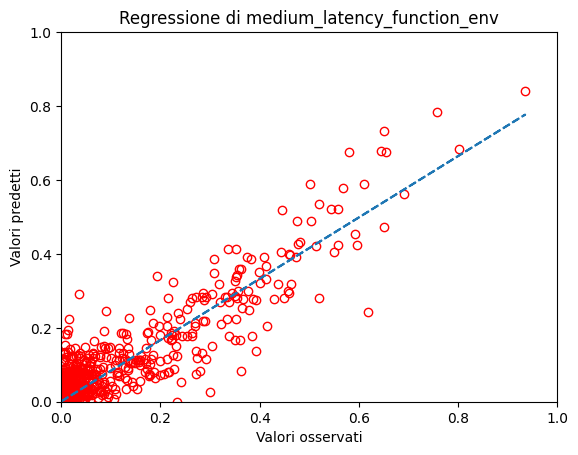

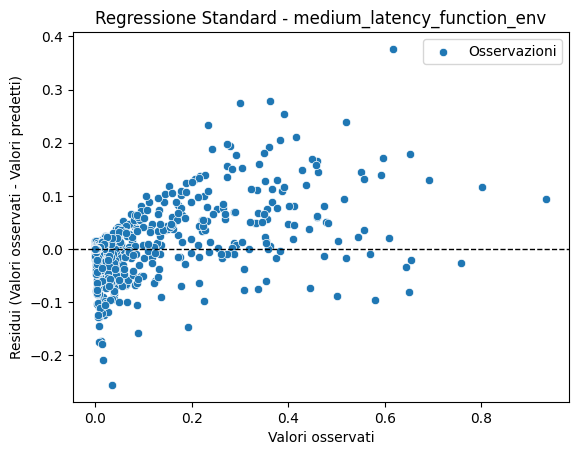

mape: 1.0108963044764159
mse: 1.3336076950468766e+17
rmse: 365185938.2625345
R-squared score: 0.8670740817217721
Standard deviation: 891535263.8655993
Quantile loss with library:  36348616.76290809
------------------------------
Target: medium_latency_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 5.289448474065964 % of cases and less or equal in 94.71055152593404 % of cases.
mape: 0.4018135101433184
mse: 0.0015241232956188908
rmse: 0.03904002171642443
R-squared score: -0.010862074535307409
Standard deviation: 0.00028684073226214275
Quantile loss with library:  0.00026873359371014865
Prediction for alpha 0.95 are greater than true values in 95.29218557547557 % of cases and less or equal in 4.707814424524429 % of cases.
mape: 3.6391254786838774
mse: 0.0007081109129940578
rmse: 0.026610353492467133
R-squared score: 0.5303513380001172
Standard deviation: 0.051434418848574685
Quantile loss with library:  0.0005938601263493482


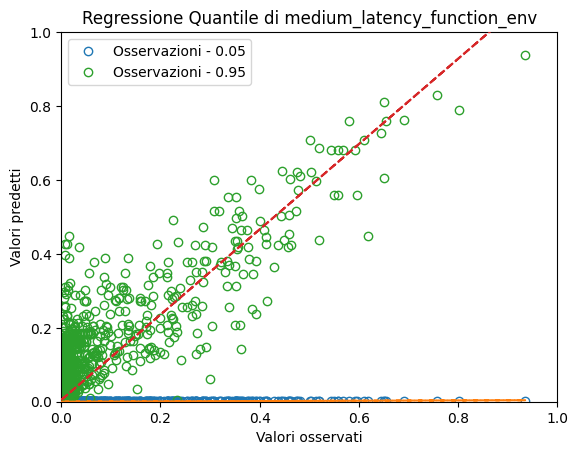

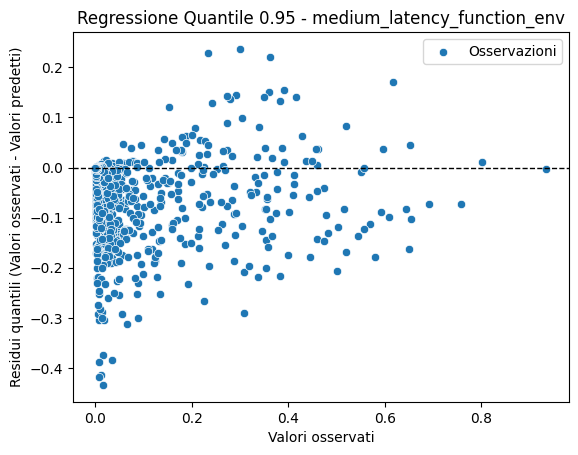

mape: 2.255589591421987
mse: 4.711850613666968e+17
rmse: 686429210.7469617
R-squared score: 0.5303513380001172
Standard deviation: 1326780102.5435545
Quantile loss with library:  15318959.890535451
------------------------------
Target: cpu_usage_function_figlet
mape: 0.04948145706759465
mse: 0.00033167345480014925
rmse: 0.018211904205770173
R-squared score: 0.9914767535947578
Standard deviation: 0.19629408845279503


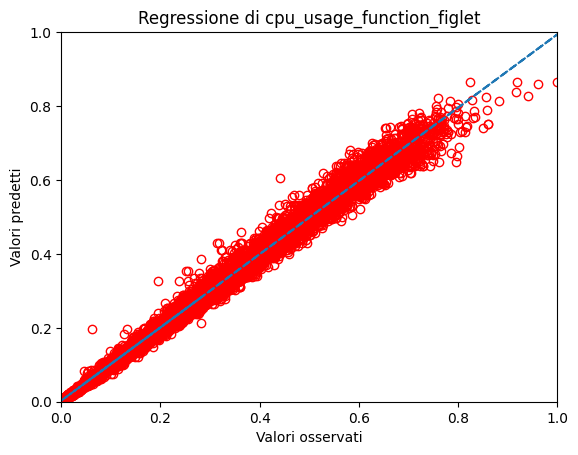

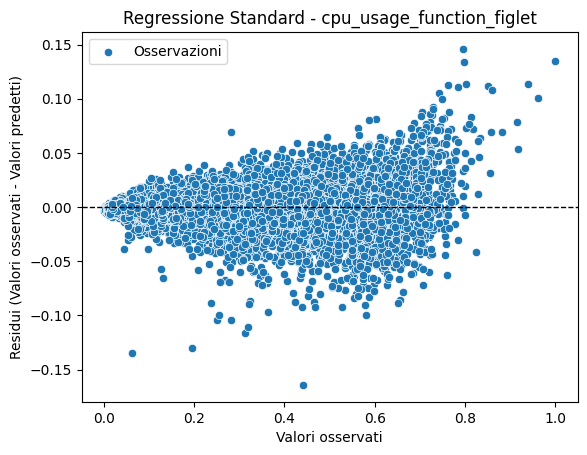

mape: 0.039170547614583856
mse: 0.4901428404778858
rmse: 0.700102021478217
R-squared score: 0.9914767535947578
Standard deviation: 7.545937348302346
Quantile loss with library:  0.23954967687968362
------------------------------
Target: cpu_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 4.790579419242607 % of cases and less or equal in 95.2094205807574 % of cases.
mape: 0.1101801782337286
mse: 0.0028089398709812176
rmse: 0.052999432742070154
R-squared score: 0.9278166934634307
Standard deviation: 0.16952910721016012
Quantile loss with library:  0.0020764978052094252
Prediction for alpha 0.95 are greater than true values in 95.51050448280476 % of cases and less or equal in 4.489495517195237 % of cases.
mape: 0.361322698218933
mse: 0.0015511447779602793
rmse: 0.039384575381236235
R-squared score: 0.9601391399841559
Standard deviation: 0.20175457840321503
Quantile loss with library:  0.00195141595327207


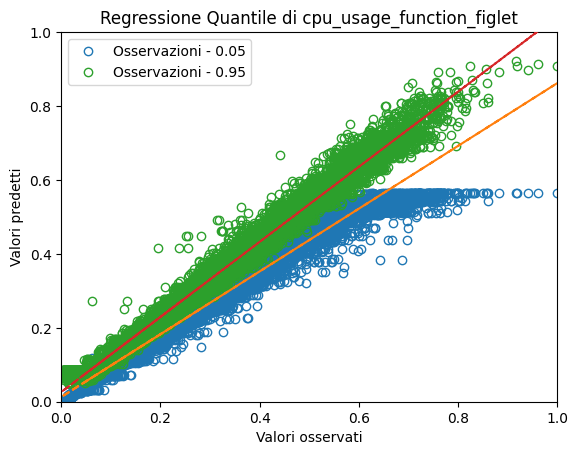

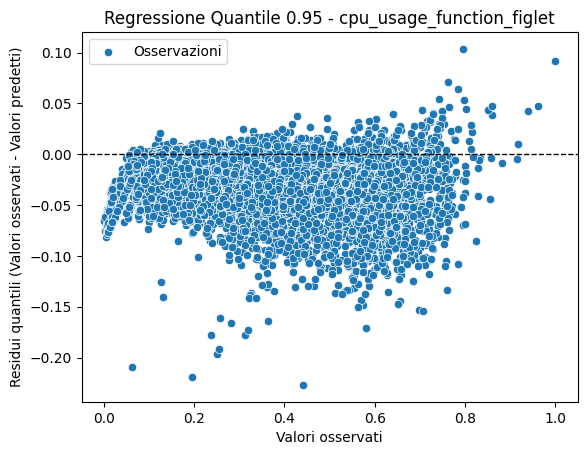

mape: 0.18565400765237872
mse: 2.2922621526042875
rmse: 1.5140218468054836
R-squared score: 0.9601391399841559
Standard deviation: 7.7558495029763925
Quantile loss with library:  0.07501633207568492
------------------------------
Target: ram_usage_function_figlet
mape: 3.649463450850666
mse: 0.0015947127167473109
rmse: 0.03993385426861914
R-squared score: 0.7602648611458143
Standard deviation: 0.07055794569194934


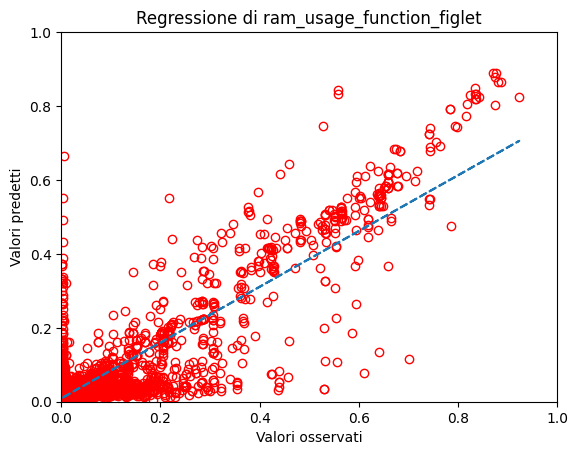

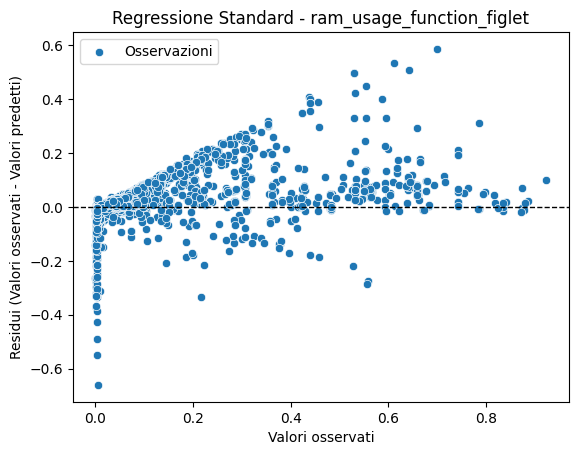

mape: 1.4074604487567028
mse: 75539995785367.75
rmse: 8691374.792595688
R-squared score: 0.7602648611458143
Standard deviation: 15356532.992765626
Quantile loss with library:  2217522.4937333693
------------------------------
Target: ram_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 6.0484410544627325 % of cases and less or equal in 93.95155894553727 % of cases.
mape: 0.4790518623476972
mse: 0.006006525062812966
rmse: 0.07750177457847637
R-squared score: 0.09703164410597498
Standard deviation: 0.018712995678185268
Quantile loss with library:  0.0014731482256479629
Prediction for alpha 0.95 are greater than true values in 95.70453633079084 % of cases and less or equal in 4.295463669209153 % of cases.
mape: 15.31659590402815
mse: 0.007434870317483436
rmse: 0.08622569406785564
R-squared score: -0.11769326801398083
Standard deviation: 0.09641737709030966
Quantile loss with library:  0.0035066663333291836


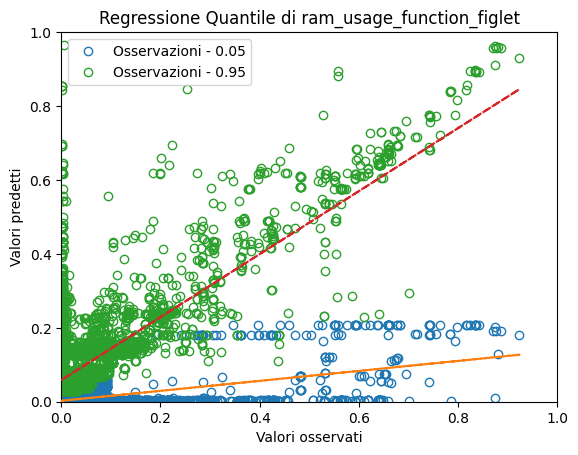

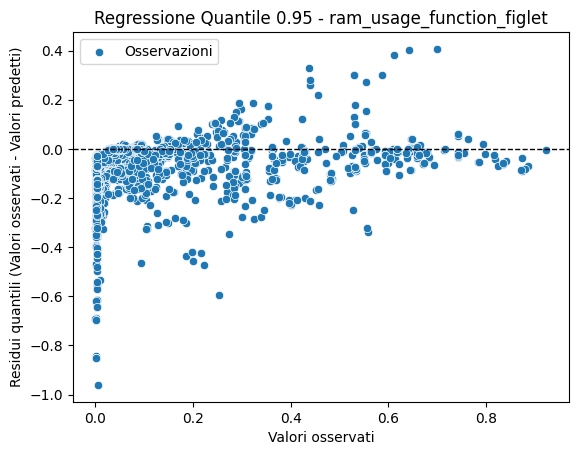

mape: 5.843143134745683
mse: 352182601009788.75
rmse: 18766528.741613053
R-squared score: -0.11769326801398061
Standard deviation: 20984690.212320134
Quantile loss with library:  763205.8546247381
------------------------------
Target: power_usage_function_figlet
mape: 50739901956.73987
mse: 0.001339737501081143
rmse: 0.03660242479783468
R-squared score: 0.9535249116976882
Standard deviation: 0.16579109676122897


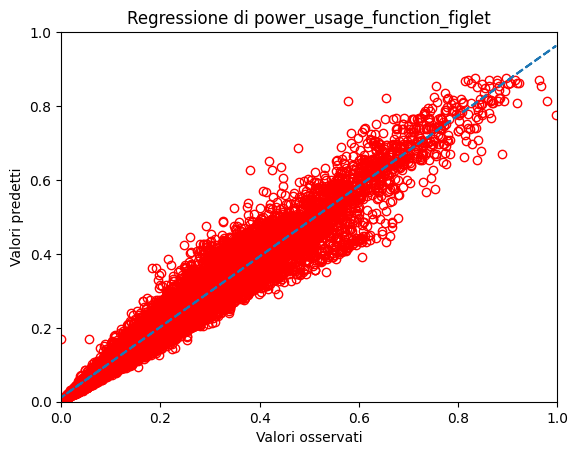

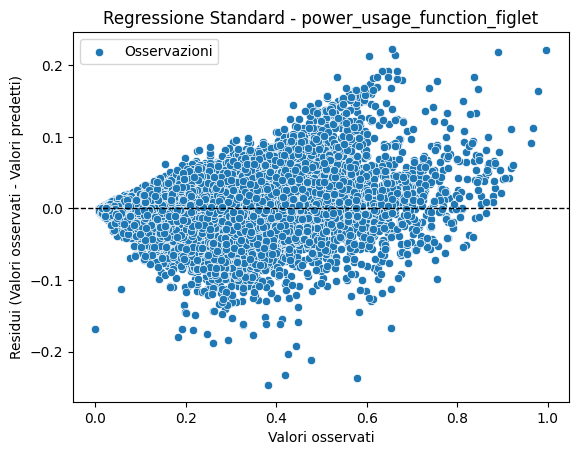

mape: 0.13249874497703615
mse: 8983237.158554493
rmse: 2997.2048909866826
R-squared score: 0.9535249116976882
Standard deviation: 13575.873424762774
Quantile loss with library:  983.0344997984612
------------------------------
Target: power_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 5.232169142245416 % of cases and less or equal in 94.76783085775459 % of cases.
mape: 40877067579.970825
mse: 0.005644005595504805
rmse: 0.07512659712448584
R-squared score: 0.8042111546342829
Standard deviation: 0.13053192086405774
Quantile loss with library:  0.003197982905843226
Prediction for alpha 0.95 are greater than true values in 94.67416031045096 % of cases and less or equal in 5.325839689549043 % of cases.
mape: 56031798140.71389
mse: 0.005691160115784305
rmse: 0.07543977807353561
R-squared score: 0.8025753786019822
Standard deviation: 0.1930797744972558
Quantile loss with library:  0.003518022116071931


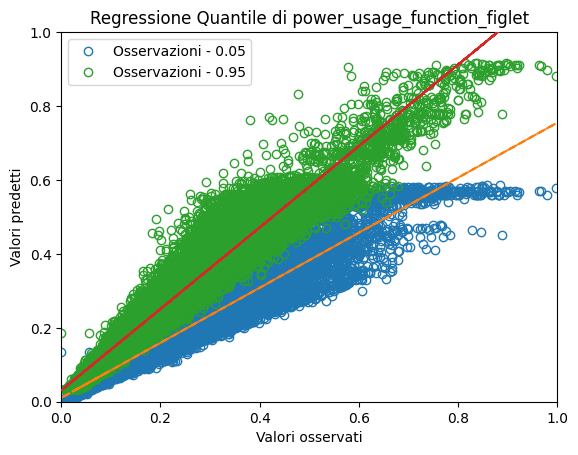

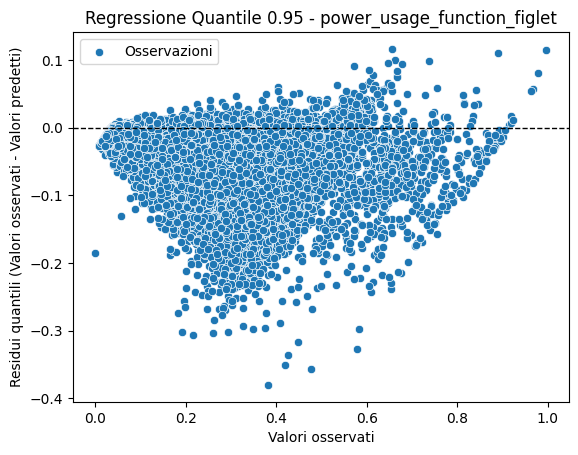

mape: 0.32410904825506553
mse: 38160491.130643055
rmse: 6177.417836818476
R-squared score: 0.8025753786019822
Standard deviation: 15810.418235133306
Quantile loss with library:  288.0747150258167
------------------------------
Target: medium_latency_function_figlet
mape: 303139702.3681109
mse: 9.041325770486915e-05
rmse: 0.009508588628438458
R-squared score: 0.925710157042133
Standard deviation: 0.03291534589723153


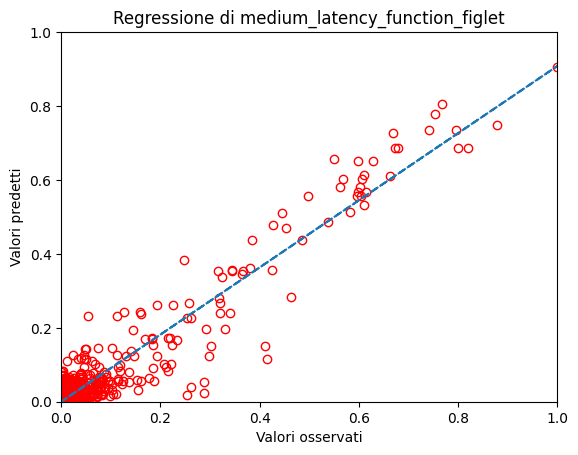

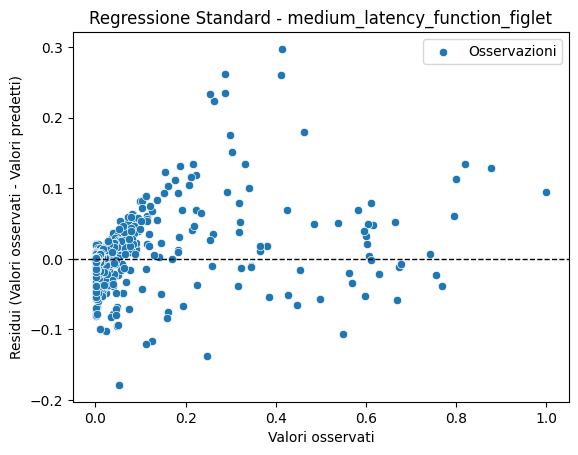

mape: 0.7940605641340293
mse: 5.495443580151876e+16
rmse: 234423624.66594267
R-squared score: 0.925710157042133
Standard deviation: 811491062.8570809
Quantile loss with library:  22761116.63940175
------------------------------
Target: medium_latency_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 5.519871537535127 % of cases and less or equal in 94.48012846246488 % of cases.
mape: 5440214.631382843
mse: 0.0012230690500559121
rmse: 0.03497240412176309
R-squared score: -0.004958896093265608
Standard deviation: 0.00023085976945574267
Quantile loss with library:  0.00018634811684275823
Prediction for alpha 0.95 are greater than true values in 94.80128462464874 % of cases and less or equal in 5.198715375351264 % of cases.
mape: 727713321.4967319
mse: 0.000277025678938013
rmse: 0.01664408840814098
R-squared score: 0.772376367072402
Standard deviation: 0.042284358087499876
Quantile loss with library:  0.0003690938797561798


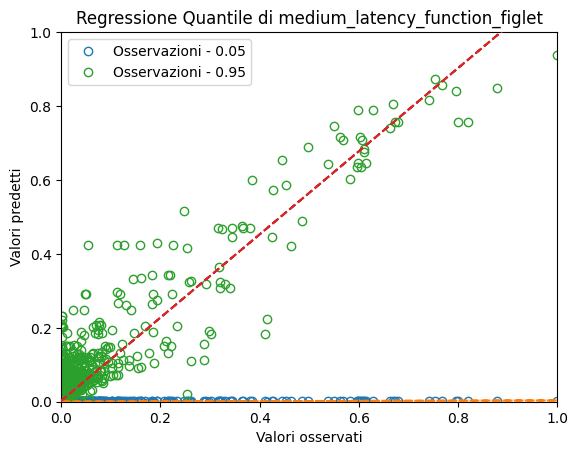

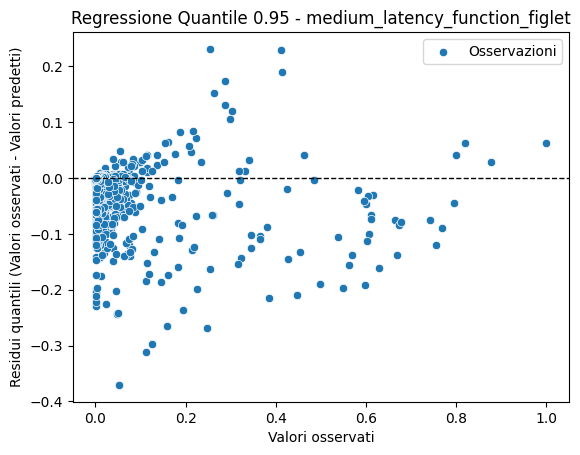

mape: 2.052353761920306
mse: 1.6838006145365683e+17
rmse: 410341396.2222881
R-squared score: 0.772376367072402
Standard deviation: 1042473586.4477348
Quantile loss with library:  9099597.060670052
------------------------------


In [86]:
quantiles_string = [str(q) for q in QUANTILES]
all_metrics = {}
all_metrics_no_scale = {}
for target_name, y_pred in all_predictions.items():
    print(f"Target: {target_name}")

    if target_name.startswith('overloaded'):
        task_type = 'binary classification'
    elif target_name.startswith('replica'):
        task_type = 'classification'
    else:
        task_type = 'regression'

    if target_name.endswith('quantiles'):
        # Get the test dataset for the current iteration
        trunc_target = target_name[0:target_name.index(' ')]
        y_test = y_test_dict[trunc_target]
        y_test_df = pd.DataFrame(y_test, columns=[trunc_target])
        y_pred_df = pd.DataFrame(y_pred, columns=quantiles_string)
        for quantile in QUANTILES:
            statistics = (y_pred_df[str(quantile)] > y_test_df[trunc_target]).value_counts(normalize=True)
            if statistics.size > 1:
                true_percentage, false_percentage = statistics[True], statistics[False]
                print(f"Prediction for alpha {quantile} are greater than true values in {true_percentage * 100} % of cases and less or equal in {false_percentage * 100} % of cases.")
            all_metrics[target_name] = metrics(task_type, y_test_df, y_pred_df[str(quantile)], quantile) 
        plot_quantile_regression(y_test, y_pred_df, trunc_target)
        # metrics on non-scaled predictions
        y_test_df_not_scaled = pd.DataFrame()
        for col in y_test_df:
            y_test_df_not_scaled[col] = [y[0] for y in y_scalers[trunc_target].inverse_transform(pd.DataFrame(y_test_df[col])).tolist()]
        y_pred_df_not_scaled = pd.DataFrame()
        for col in y_pred_df:
            y_pred_df_not_scaled[col] = [y[0] for y in y_scalers[trunc_target].inverse_transform(pd.DataFrame(y_pred_df[col])).tolist()]
        all_metrics_no_scale[target_name] = metrics(task_type, y_test_df_not_scaled, y_pred_df_not_scaled[str(quantile)], quantile) 
    else:
        y_test = y_test_dict[target_name]
        y_test_df = pd.DataFrame(y_test, columns=[target_name])
        y_pred_df = pd.DataFrame(y_pred, columns=[target_name])
        all_metrics[target_name] = metrics(task_type, y_test_df, y_pred_df, 0)
        if task_type == 'regression':
            plot_regression(y_test, y_pred, target_name)
        # metrics on non-scaled predictions
        y_test_df_not_scaled = pd.DataFrame()
        for col in y_test_df:
            y_test_df_not_scaled[col] = [y[0] for y in y_scalers[target_name].inverse_transform(pd.DataFrame(y_test_df[col])).tolist()]
        y_pred_df_not_scaled = pd.DataFrame()
        for col in y_pred_df:
            y_pred_df_not_scaled[col] = [y[0] for y in y_scalers[target_name].inverse_transform(pd.DataFrame(y_pred_df[col])).tolist()]
        all_metrics_no_scale[target_name] = metrics(task_type, y_test_df_not_scaled, y_pred_df_not_scaled, quantile) 
    
    print("-" * 30)

all_metrics = pd.DataFrame(all_metrics).transpose().sort_index()
all_metrics_no_scale = pd.DataFrame(all_metrics_no_scale).transpose().sort_index()

In [87]:
os.makedirs("output/metrics/functions", exist_ok = True)
all_metrics.to_csv("output/metrics/functions/all_metrics.csv")
all_metrics

,mape,mse,rmse,r2,quantile_loss,std_dev
cpu_usage_function_curl,0.076994,0.000521,0.022827,0.986309,Not calculated for this target,0.193323
cpu_usage_function_curl quantiles,0.260071,0.002344,0.048415,0.938413,0.002209,0.205357
cpu_usage_function_eat-memory,26115958081.95665,0.000317,0.017794,0.988606,Not calculated for this target,0.165649
cpu_usage_function_eat-memory quantiles,110863990063.704117,0.001192,0.034524,0.957107,0.001567,0.177567
cpu_usage_function_env,53017206164.578682,0.000297,0.017242,0.988382,Not calculated for this target,0.158951
cpu_usage_function_env quantiles,99669652056.848114,0.001181,0.03436,0.95386,0.001628,0.167611
cpu_usage_function_figlet,0.049481,0.000332,0.018212,0.991477,Not calculated for this target,0.196294
cpu_usage_function_figlet quantiles,0.361323,0.001551,0.039385,0.960139,0.001951,0.201755
cpu_usage_function_nmap,0.06358,0.000476,0.021822,0.988934,Not calculated for this target,0.206646
cpu_usage_function_nmap quantiles,0.21035,0.002331,0.048285,0.945823,0.002213,0.213954


In [ ]:
all_metrics_no_scale.to_csv("output/metrics/functions/all_metrics_no_scale.csv")
all_metrics_no_scale